#### Import Libraries

In [135]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

In [25]:
df = pd.read_csv('Hospital_-_Data.xls')

In [20]:
df

,SL.,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,...,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT,TOTAL COST TO HOSPITAL
0,1,58.0,M,MARRIED,other- heart,49.2,160,118,100.0,80.0,...,0.8,AMBULANCE,ALERT,EMERGENCY,25,12,13,Y,38000,660293.0
1,2,59.0,M,MARRIED,CAD-DVD,41.0,155,78,70.0,50.0,...,1.7,AMBULANCE,ALERT,EMERGENCY,41,20,21,Y,39690,809130.0
2,3,82.0,M,MARRIED,CAD-TVD,46.6,164,100,110.0,80.0,...,0.8,WALKED IN,ALERT,ELECTIVE,18,9,9,N,0,362231.0
3,4,46.0,M,MARRIED,CAD-DVD,80.0,173,122,110.0,80.0,...,1.5,AMBULANCE,ALERT,EMERGENCY,14,13,1,Y,89450,629990.0
4,5,60.0,M,MARRIED,CAD-DVD,58.0,175,72,180.0,100.0,...,1.9,AMBULANCE,ALERT,EMERGENCY,24,12,12,N,0,444876.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,244,51.0,M,MARRIED,other- heart,69.0,176,62,130.0,90.0,...,1.1,WALKED IN,ALERT,ELECTIVE,10,3,7,Y,35000,295155.0
244,245,58.0,M,MARRIED,CAD-TVD,57.0,159,58,100.0,70.0,...,0.8,WALKED IN,ALERT,ELECTIVE,11,2,9,Y,26000,200321.0
245,246,44.0,M,MARRIED,CAD-TVD,58.0,159,68,150.0,90.0,...,0.9,WALKED IN,ALERT,ELECTIVE,13,5,8,N,0,191188.0
246,247,60.0,M,MARRIED,other- heart,65.0,165,98,100.0,60.0,...,1.0,AMBULANCE,ALERT,EMERGENCY,9,6,3,N,0,202807.0


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   SL.                           248 non-null    int64  
 1   AGE                           248 non-null    float64
 2   GENDER                        248 non-null    object 
 3   MARITAL STATUS                248 non-null    object 
 4   KEY COMPLAINTS -CODE          212 non-null    object 
 5   BODY WEIGHT                   248 non-null    float64
 6   BODY HEIGHT                   248 non-null    int64  
 7   HR PULSE                      248 non-null    int64  
 8   BP -HIGH                      225 non-null    float64
 9   BP-LOW                        225 non-null    float64
 10  RR                            248 non-null    int64  
 11  PAST MEDICAL HISTORY CODE     75 non-null     object 
 12  HB                            246 non-null    float64
 13  UREA 

In [5]:
df['AGE'] #getting age column.

0      58.0
1      59.0
2      82.0
3      46.0
4      60.0
       ... 
243    51.0
244    58.0
245    44.0
246    60.0
247    30.0
Name: AGE, Length: 248, dtype: float64

In [145]:
(df['AGE']>=20).sum()

115

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='AGE', ylabel='TOTAL COST TO HOSPITAL '>

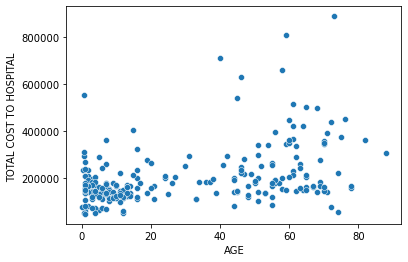

In [7]:
sns.scatterplot(df['AGE'], df['TOTAL COST TO HOSPITAL '])

<AxesSubplot:ylabel='Density'>

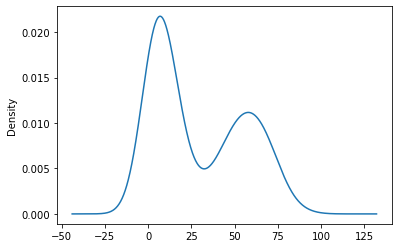

In [9]:
df['AGE'].plot.kde()

In [14]:
df.columns

Index(['SL.', 'AGE', 'GENDER', 'MARITAL STATUS', 'KEY COMPLAINTS -CODE',
       'BODY WEIGHT', 'BODY HEIGHT', 'HR PULSE', 'BP -HIGH', 'BP-LOW', 'RR',
       'PAST MEDICAL HISTORY CODE', 'HB', 'UREA', 'CREATININE',
       'MODE OF ARRIVAL', 'STATE AT THE TIME OF ARRIVAL', 'TYPE OF ADMSN',
       'TOTAL LENGTH OF STAY', 'LENGTH OF STAY - ICU', 'LENGTH OF STAY- WARD',
       'IMPLANT USED (Y/N)', 'COST OF IMPLANT', 'TOTAL COST TO HOSPITAL '],
      dtype='object')

In [17]:
groupped = df.groupby('GENDER')['TOTAL COST TO HOSPITAL '].mean()

In [19]:
groupped.values

array([172111.92390244, 211868.72379518])

In [147]:
df['GENDER'].value_counts()

M    166
F     82
Name: GENDER, dtype: int64

<AxesSubplot:xlabel='AGE', ylabel='Density'>

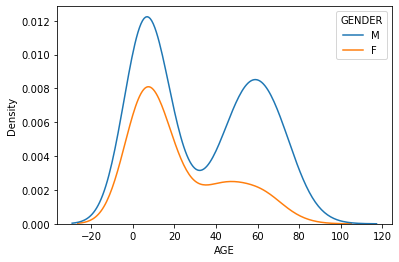

In [149]:
sns.kdeplot(df['AGE'],hue = df['GENDER'])

<AxesSubplot:xlabel='GENDER'>

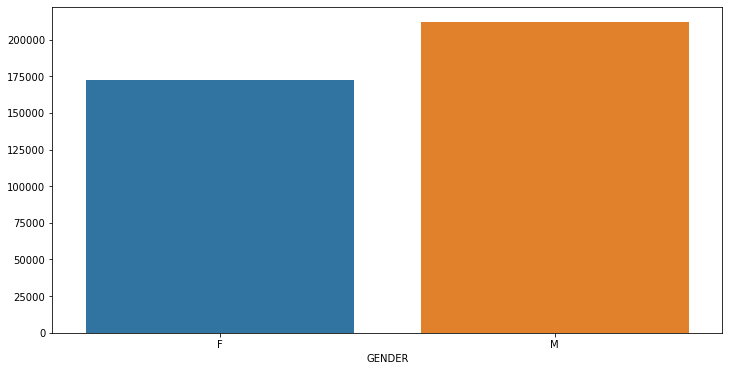

In [23]:
plt.figure(figsize=(12,6))
sns.barplot(y = groupped.values, x = groupped.index)

In [26]:
df['MARITAL STATUS'].value_counts()

UNMARRIED    140
MARRIED      108
Name: MARITAL STATUS, dtype: int64

In [27]:
group_2 = df.groupby('MARITAL STATUS')['TOTAL COST TO HOSPITAL '].mean()

group_2

MARITAL STATUS
MARRIED      250975.247315
UNMARRIED    158414.708571
Name: TOTAL COST TO HOSPITAL , dtype: float64

In [155]:
df.groupby([pd.cut(df['AGE'], bins = 3),'PAST MEDICAL HISTORY CODE']).count()

SL.  AGE  GENDER  MARITAL STATUS  \
AGE               PAST MEDICAL HISTORY CODE                                     
(-0.0551, 29.355] Diabetes1                    0    0       0               0   
                  Diabetes2                    1    1       1               1   
                  Hypertension1                0    0       0               0   
                  hypertension1                0    0       0               0   
                  hypertension2                3    3       3               3   
                  hypertension3                0    0       0               0   
                  other                       13   13      13              13   
(29.355, 58.678]  Diabetes1                    5    5       5               5   
                  Diabetes2                    2    2       2               2   
                  Hypertension1                1    1       1               1   
                  hypertension1                7    7       7               7   
                  hypertension2                7    7       7               7   
                  hypertension3                2    2       2               2   
                  other                        1    1       1               1   
(58.678, 88.0]    Diabetes1                    5    5       5               5   
                  Diabetes2                    6    6       6               6   
                  Hypertension1                2    2       2               2   
                  hypertension1               13   13      13              13   
                  hypertension2                3    3       3               3   
                  hypertension3                3    3       3               3   
                  other                        1    1       1               1   

                                             KEY COMPLAINTS -CODE  \
AGE               PAST MEDICAL HISTORY CODE                         
(-0.0551, 29.355] Diabetes1                                     0   
                  Diabetes2                                     1   
                  Hypertension1                                 0   
                  hypertension1                                 0   
                  hypertension2                                 2   
                  hypertension3                                 0   
                  other                                        12   
(29.355, 58.678]  Diabetes1                                     5   
                  Diabetes2                                     2   
                  Hypertension1                                 1   
                  hypertension1                                 7   
                  hypertension2                                 4   
                  hypertension3                                 0   
                  other                                         1   
(58.678, 88.0]    Diabetes1                                     5   
                  Diabetes2                                     6   
                  Hypertension1                                 1   
                  hypertension1                                10   
                  hypertension2                                 3   
                  hypertension3                                 3   
                  other                                         1   

                                             BODY WEIGHT  BODY HEIGHT  \
AGE               PAST MEDICAL HISTORY CODE                             
(-0.0551, 29.355] Diabetes1                            0            0   
                  Diabetes2                            1            1   
                  Hypertension1                        0            0   
                  hypertension1                        0            0   
                  hypertension2                        3            3   
                  hypertension3                        0            0   
         

**Observation:**
* Married people's total cost to hospital is higher.

In [29]:
df['KEY COMPLAINTS -CODE'].value_counts()

other- heart          55
CAD-DVD               27
RHD                   26
CAD-TVD               24
ACHD                  19
other-tertalogy       18
OS-ASD                15
other- respiratory    15
PM-VSD                 6
other-nervous          3
CAD-SVD                2
CAD-VSD                1
other-general          1
Name: KEY COMPLAINTS -CODE, dtype: int64

In [156]:
df.groupby([pd.cut(df['AGE'], bins = 3),'KEY COMPLAINTS -CODE']).count()

SL.  AGE  GENDER  MARITAL STATUS  \
AGE               KEY COMPLAINTS -CODE                                     
(-0.0551, 29.355] ACHD                   14   14      14              14   
                  CAD-DVD                 0    0       0               0   
                  CAD-SVD                 0    0       0               0   
                  CAD-TVD                 1    1       1               1   
                  CAD-VSD                 1    1       1               1   
                  OS-ASD                 13   13      13              13   
                  PM-VSD                  6    6       6               6   
                  RHD                    12   12      12              12   
                  other- heart           42   42      42              42   
                  other- respiratory     14   14      14              14   
                  other-general           0    0       0               0   
                  other-nervous           3    3       3               3   
                  other-tertalogy        18   18      18              18   
(29.355, 58.678]  ACHD                    4    4       4               4   
                  CAD-DVD                12   12      12              12   
                  CAD-SVD                 1    1       1               1   
                  CAD-TVD                 9    9       9               9   
                  CAD-VSD                 0    0       0               0   
                  OS-ASD                  2    2       2               2   
                  PM-VSD                  0    0       0               0   
                  RHD                    11   11      11              11   
                  other- heart            6    6       6               6   
                  other- respiratory      0    0       0               0   
                  other-general           0    0       0               0   
                  other-nervous           0    0       0               0   
                  other-tertalogy         0    0       0               0   
(58.678, 88.0]    ACHD                    1    1       1               1   
                  CAD-DVD                15   15      15              15   
                  CAD-SVD                 1    1       1               1   
                  CAD-TVD                14   14      14              14   
                  CAD-VSD                 0    0       0               0   
                  OS-ASD                  0    0       0               0   
                  PM-VSD                  0    0       0               0   
                  RHD                     3    3       3               3   
                  other- heart            7    7       7               7   
                  other- respiratory      1    1       1               1   
                  other-general           1    1       1               1   
                  other-nervous           0    0       0               0   
                  other-tertalogy         0    0       0               0   

                                        BODY WEIGHT  BODY HEIGHT  HR PULSE  \
AGE               KEY COMPLAINTS -CODE                                       
(-0.0551, 29.355] ACHD                           14           14        14   
                  CAD-DVD                         0            0         0   
                  CAD-SVD                         0            0         0   
                  CAD-TVD                         1            1         1   
                  CAD-VSD                         1            1         1   
                  OS-ASD                         13           13        13   
                  PM-VSD                          6            6         6   
                  RHD                            12           12        12   
                  other- heart                   42           42        42   
                  other- respiratory             14           14 

In [30]:
group_3 = df.groupby('KEY COMPLAINTS -CODE')['TOTAL COST TO HOSPITAL '].mean()

group_3

KEY COMPLAINTS -CODE
ACHD                  128507.335789
CAD-DVD               310210.698519
CAD-SVD               269220.915000
CAD-TVD               278512.165000
CAD-VSD               140545.000000
OS-ASD                141141.174000
PM-VSD                144657.500000
RHD                   255411.163846
other- heart          189239.441818
other- respiratory    153260.044667
other-general          55885.700000
other-nervous         158139.166667
other-tertalogy       167761.788333
Name: TOTAL COST TO HOSPITAL , dtype: float64

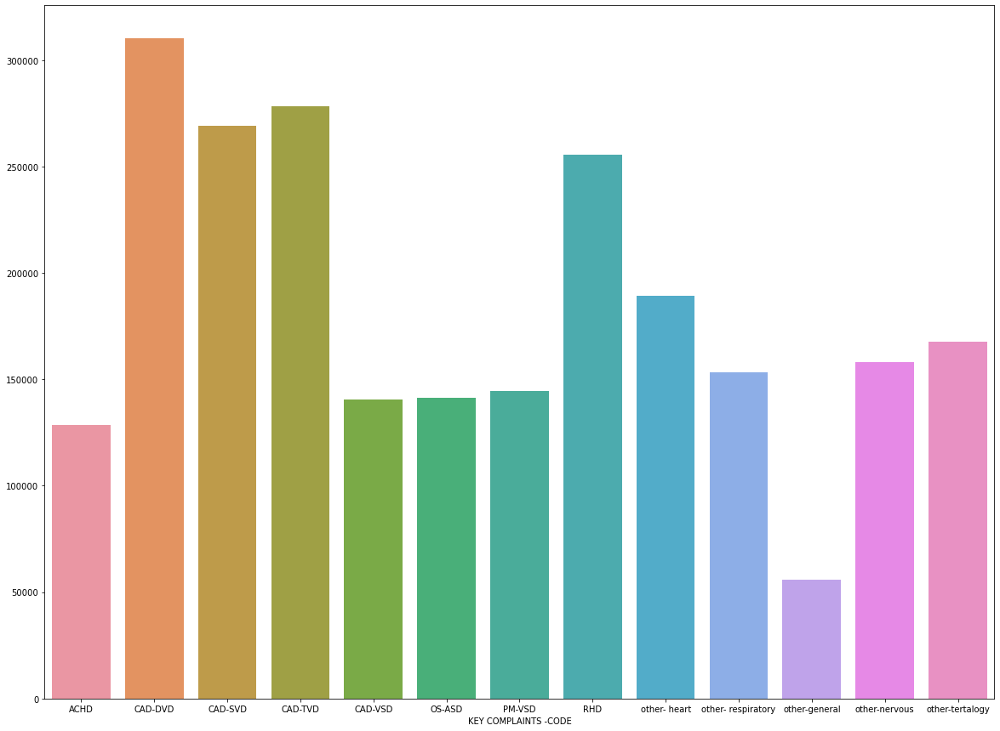

In [33]:
plt.figure(figsize=(20,15))
sns.barplot(y = group_3.values, x = group_3.index);

**Observation:**
* CAD DVD has the highest total cost to hospital.

In [35]:
df['BODY WEIGHT'].nunique()

148

<AxesSubplot:xlabel='BODY WEIGHT', ylabel='TOTAL COST TO HOSPITAL '>

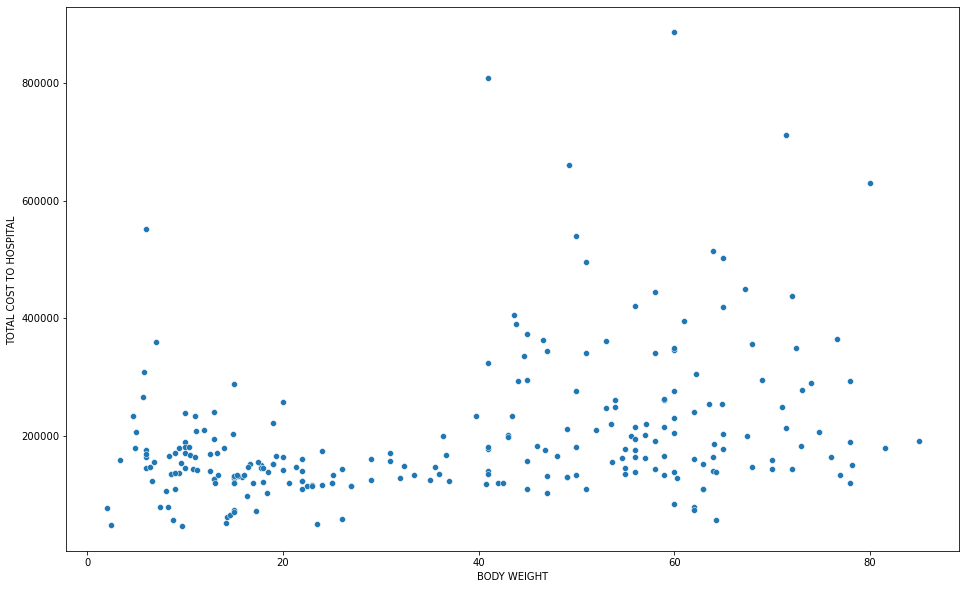

In [37]:
plt.figure(figsize = (16,10))
sns.scatterplot(x = df['BODY WEIGHT'], y = df['TOTAL COST TO HOSPITAL '])

<AxesSubplot:ylabel='Density'>

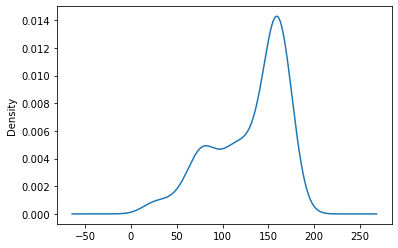

In [40]:
df['BODY HEIGHT'].plot.kde()

<AxesSubplot:ylabel='Density'>

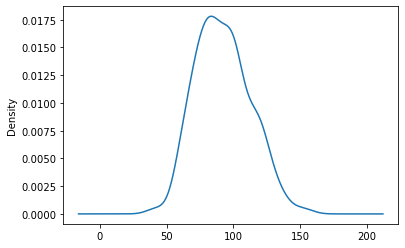

In [42]:
df['HR PULSE'].plot.kde()

<AxesSubplot:ylabel='Density'>

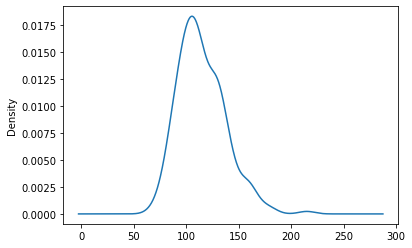

In [43]:
df['BP -HIGH'].plot.kde()

In [45]:
df['BP-LOW'].nunique()

27

<AxesSubplot:ylabel='Density'>

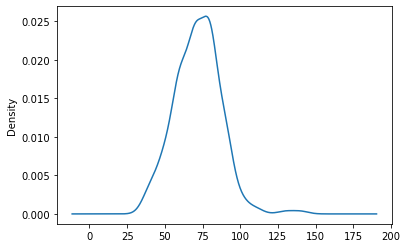

In [46]:
df['BP-LOW'].plot.kde()

In [48]:
df['RR'].nunique()

22

<AxesSubplot:ylabel='Density'>

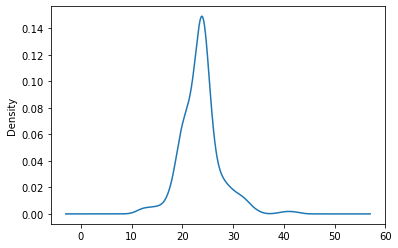

In [49]:
df['RR'].plot.kde()

In [53]:
group_4 = df.groupby('PAST MEDICAL HISTORY CODE')['TOTAL COST TO HOSPITAL '].mean()

<AxesSubplot:xlabel='PAST MEDICAL HISTORY CODE'>

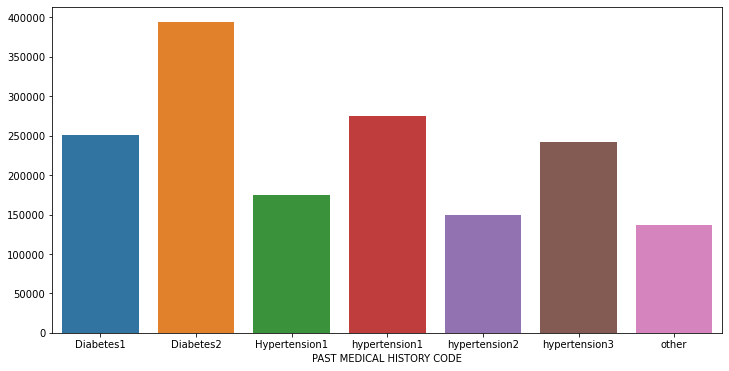

In [54]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_4.values, x = group_4.index)

<AxesSubplot:ylabel='Density'>

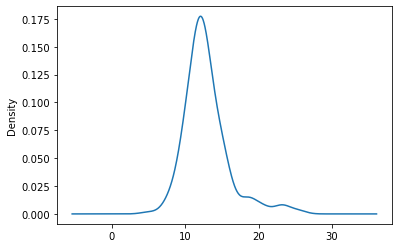

In [56]:
df['HB'].plot.kde()

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='UREA', ylabel='Density'>

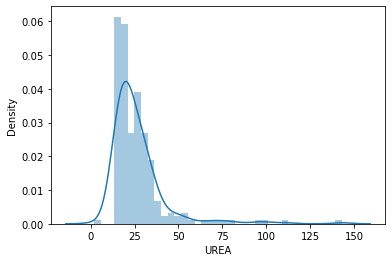

In [58]:
sns.distplot(df['UREA'])

<AxesSubplot:ylabel='Density'>

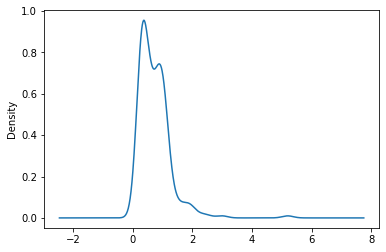

In [59]:
df['CREATININE'].plot.kde()

In [61]:
group_5 = df.groupby(['MODE OF ARRIVAL'])['TOTAL COST TO HOSPITAL '].mean()

group_5

MODE OF ARRIVAL
AMBULANCE      315382.537333
TRANSFERRED    126685.937500
WALKED IN      183715.729159
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='MODE OF ARRIVAL'>

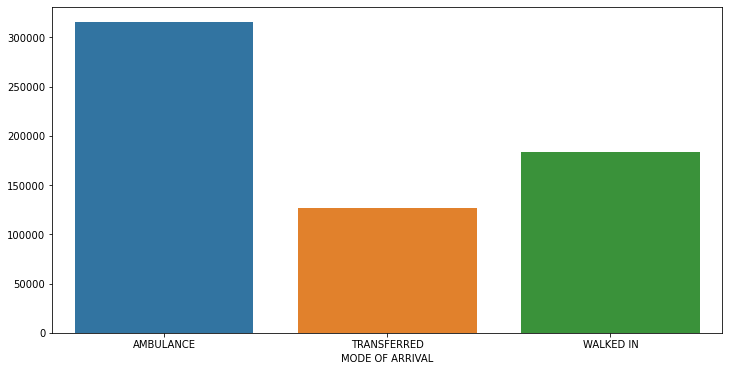

In [62]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_5.values, x = group_5.index)

#### Observation

* Mode of travel Ambulance has highest Total Cost To hospital.

In [64]:
group_6 = df.groupby(['STATE AT THE TIME OF ARRIVAL'])['TOTAL COST TO HOSPITAL '].mean()

group_6

STATE AT THE TIME OF ARRIVAL
ALERT       198113.635263
CONFUSED    349318.000000
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='STATE AT THE TIME OF ARRIVAL'>

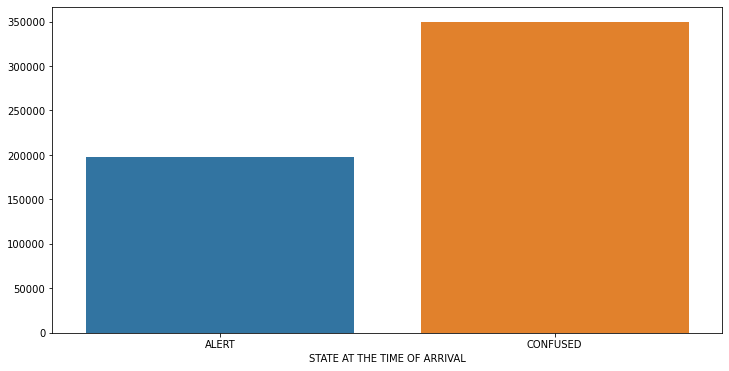

In [65]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_6.values, x = group_6.index)

In [67]:
group_7 = df.groupby(['TYPE OF ADMSN'])['TOTAL COST TO HOSPITAL '].mean()

group_7

TYPE OF ADMSN
ELECTIVE     182081.226574
EMERGENCY    311057.530312
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='TYPE OF ADMSN'>

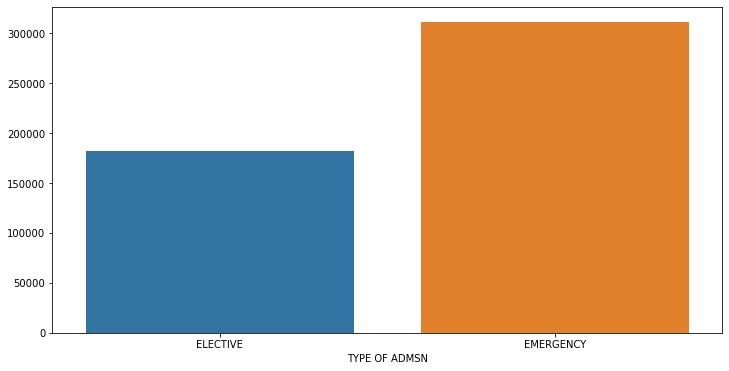

In [68]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_7.values, x = group_7.index)

**Observation:**
* Emergency patients have higher total cost to hospital.

In [70]:
df['TOTAL LENGTH OF STAY'].nunique()

27

In [74]:
group_8 = df.groupby(['TOTAL LENGTH OF STAY'])['TOTAL COST TO HOSPITAL '].mean()

<AxesSubplot:xlabel='TOTAL LENGTH OF STAY'>

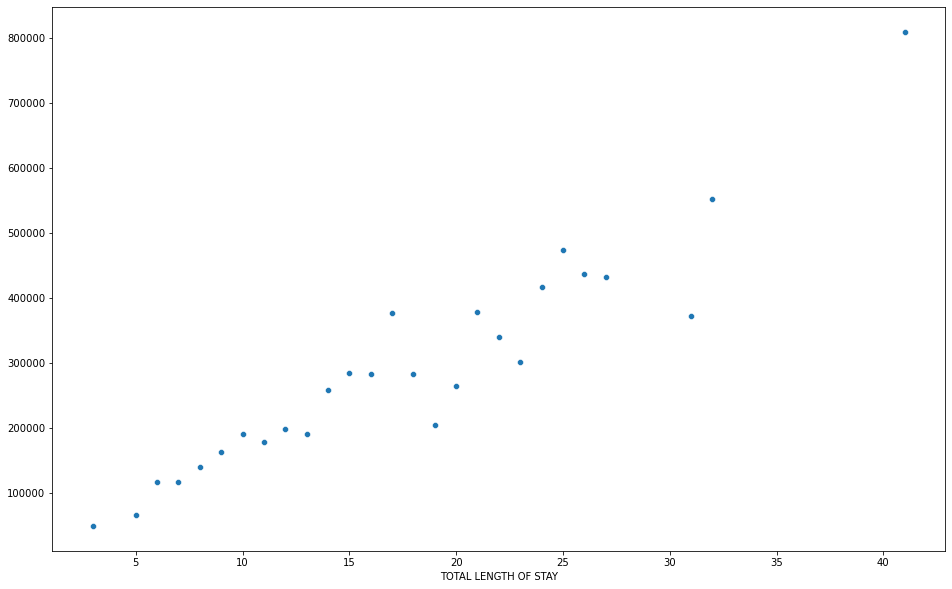

In [76]:
plt.figure(figsize=(16,10))
sns.scatterplot(x = group_8.index, y = group_8.values)
#Higher the total length of stay, higher the total cost of hospital.

In [77]:
group_9 = df.groupby(['LENGTH OF STAY - ICU'])['TOTAL COST TO HOSPITAL '].mean()
group_9

LENGTH OF STAY - ICU
0     103475.733333
1     127537.912987
2     162250.480758
3     174679.401562
4     221573.331765
5     255341.564286
6     236289.502222
8     247335.000000
9     363029.345000
10    478386.600000
11    389998.000000
12    455032.600000
13    539692.500000
15    576296.500000
16    495968.700000
20    809130.000000
22    539976.000000
30    551809.000000
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='LENGTH OF STAY - ICU'>

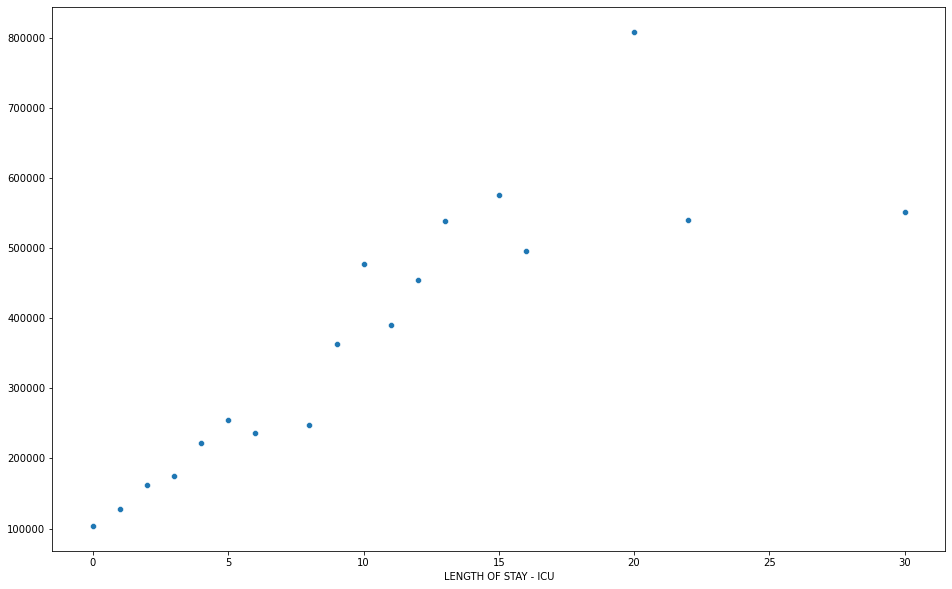

In [79]:
plt.figure(figsize=(16,10))
sns.scatterplot(x = group_9.index, y = group_9.values)
#Higher the LENGTH OF STAY - ICU, higher the total cost of hospital.

<AxesSubplot:xlabel='LENGTH OF STAY - ICU'>

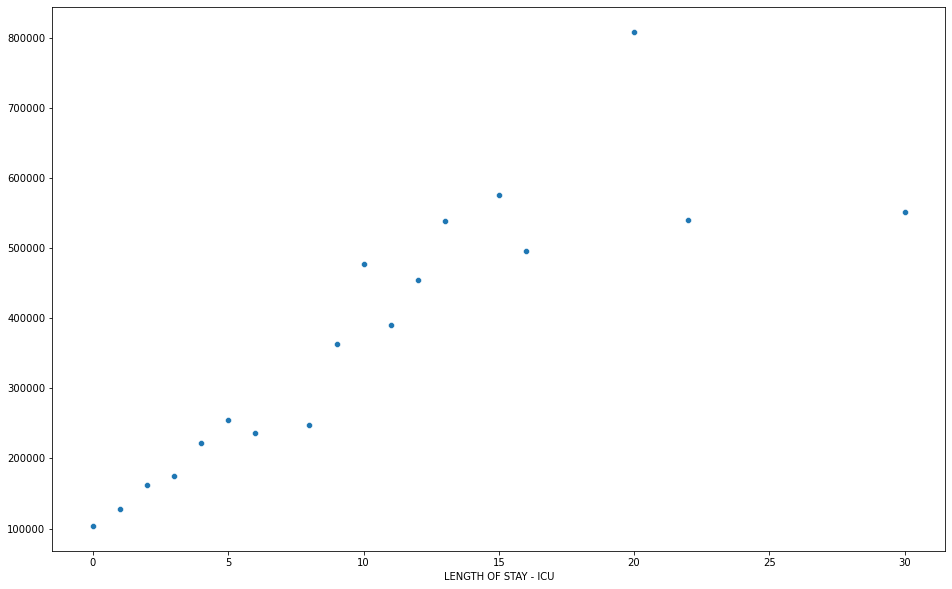

In [82]:
group_10 = df.groupby(['LENGTH OF STAY- WARD'])['TOTAL COST TO HOSPITAL '].mean()
plt.figure(figsize=(16,10))
sns.scatterplot(x = group_9.index, y = group_9.values)
#Higher the LENGTH OF STAY - ICU, higher the total cost of hospital.

In [11]:
df.isna().sum()

SL.                               0
AGE                               0
GENDER                            0
MARITAL STATUS                    0
KEY COMPLAINTS -CODE             36
BODY WEIGHT                       0
BODY HEIGHT                       0
HR PULSE                          0
BP -HIGH                         23
BP-LOW                           23
RR                                0
PAST MEDICAL HISTORY CODE       173
HB                                2
UREA                             13
CREATININE                       33
MODE OF ARRIVAL                   0
STATE AT THE TIME OF ARRIVAL      0
TYPE OF ADMSN                     0
TOTAL LENGTH OF STAY              0
LENGTH OF STAY - ICU              0
LENGTH OF STAY- WARD              0
IMPLANT USED (Y/N)                0
COST OF IMPLANT                   0
TOTAL COST TO HOSPITAL            0
dtype: int64

In [87]:
group_11 = df.groupby(['IMPLANT USED (Y/N)'])['TOTAL COST TO HOSPITAL '].mean()

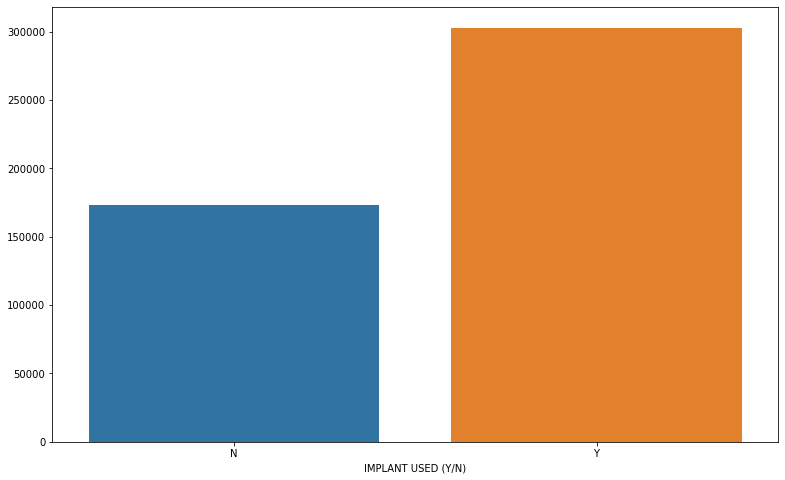

In [93]:
plt.figure(figsize=(13,8))
sns.barplot(x = group_11.index, y = group_11.values);

**Observation:**
* Implant used patients have higher total cost compared to no implant used

In [96]:
corr = df.corr()

corr

,SL.,AGE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,HB,UREA,CREATININE,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,COST OF IMPLANT,TOTAL COST TO HOSPITAL
SL.,1.000000,-0.324239,-0.243981,-0.216327,0.058443,-0.129061,-0.118160,-0.121831,0.103770,-0.174034,-0.430490,-0.407325,-0.448393,-0.120290,-0.099933,-0.498937
AGE,-0.324239,1.000000,0.848397,0.717492,-0.483498,0.608032,0.468121,-0.284377,-0.132305,0.231687,0.602261,0.215110,0.345183,-0.051822,0.182169,0.420697
BODY WEIGHT,-0.243981,0.848397,1.000000,0.849963,-0.564886,0.617656,0.511921,-0.316843,-0.086965,0.172141,0.585587,0.053802,0.228660,-0.159878,0.277585,0.348270
BODY HEIGHT,-0.216327,0.717492,0.849963,1.000000,-0.535004,0.512494,0.435541,-0.300503,-0.055917,0.162902,0.523436,0.002191,0.137965,-0.139425,0.277072,0.293828
HR PULSE,0.058443,-0.483498,-0.564886,-0.535004,1.000000,-0.317527,-0.218276,0.398739,0.028690,-0.024554,-0.385274,0.123733,0.041949,0.136957,-0.073423,-0.008536
BP -HIGH,-0.129061,0.608032,0.617656,0.512494,-0.317527,1.000000,0.766872,-0.134212,-0.061382,0.052586,0.394862,0.043380,0.152384,-0.095080,0.035315,0.182876
BP-LOW,-0.118160,0.468121,0.511921,0.435541,-0.218276,0.766872,1.000000,-0.076422,0.042393,0.024781,0.210442,0.016697,0.096495,-0.074687,0.079318,0.158195
RR,-0.121831,-0.284377,-0.316843,-0.300503,0.398739,-0.134212,-0.076422,1.000000,0.005896,0.041773,-0.233838,0.175510,0.055049,0.199682,-0.021318,0.016181
HB,0.103770,-0.132305,-0.086965,-0.055917,0.028690,-0.061382,0.042393,0.005896,1.000000,-0.073737,-0.178332,0.012601,-0.090243,0.115520,-0.089840,-0.061601
UREA,-0.174034,0.231687,0.172141,0.162902,-0.024554,0.052586,0.024781,0.041773,-0.073737,1.000000,0.558106,0.224382,0.234746,0.082015,0.252324,0.276581


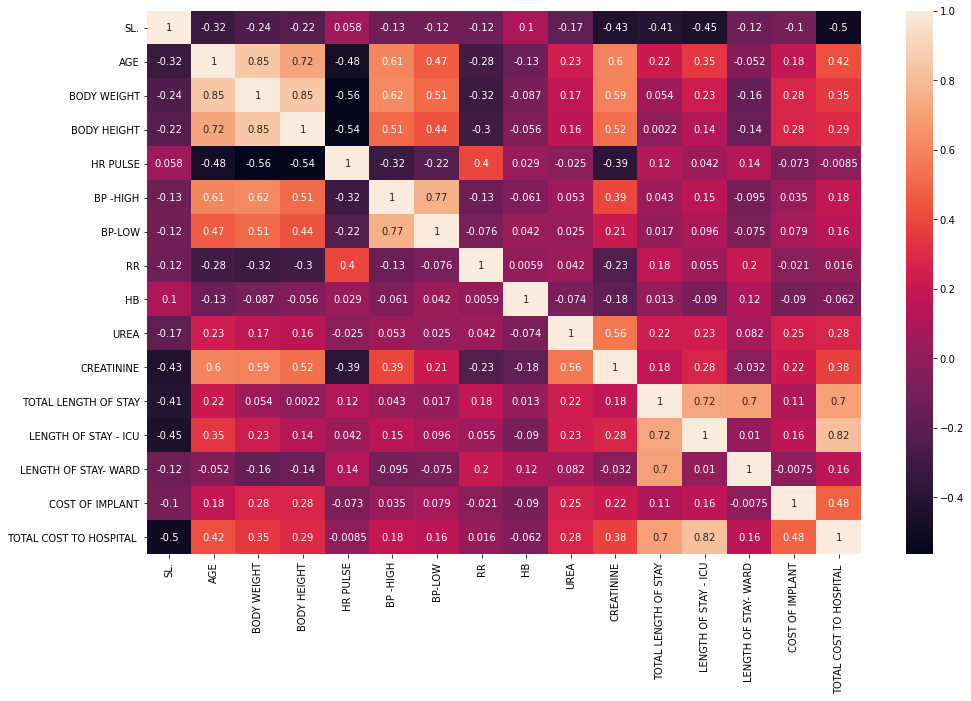

In [100]:
plt.figure(figsize=(16,10))
sns.heatmap(corr, annot=True, linecolor='w');

In [109]:
def scatter(x,y):
    plt.figure(figsize=(16,10))
    sns.scatterplot(x = df[x],y = df[y])
    plt.show()

In [104]:
df.columns

Index(['SL.', 'AGE', 'GENDER', 'MARITAL STATUS', 'KEY COMPLAINTS -CODE',
       'BODY WEIGHT', 'BODY HEIGHT', 'HR PULSE', 'BP -HIGH', 'BP-LOW', 'RR',
       'PAST MEDICAL HISTORY CODE', 'HB', 'UREA', 'CREATININE',
       'MODE OF ARRIVAL', 'STATE AT THE TIME OF ARRIVAL', 'TYPE OF ADMSN',
       'TOTAL LENGTH OF STAY', 'LENGTH OF STAY - ICU', 'LENGTH OF STAY- WARD',
       'IMPLANT USED (Y/N)', 'COST OF IMPLANT', 'TOTAL COST TO HOSPITAL '],
      dtype='object')

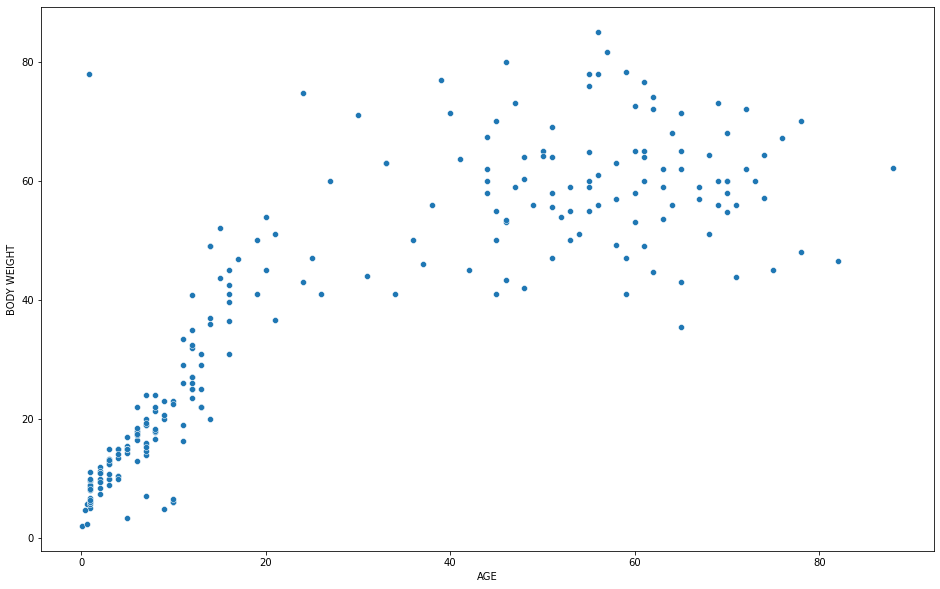

In [110]:
scatter('AGE', 'BODY WEIGHT')
#Body weight increases upto age 20 and then it reaches saturation level.

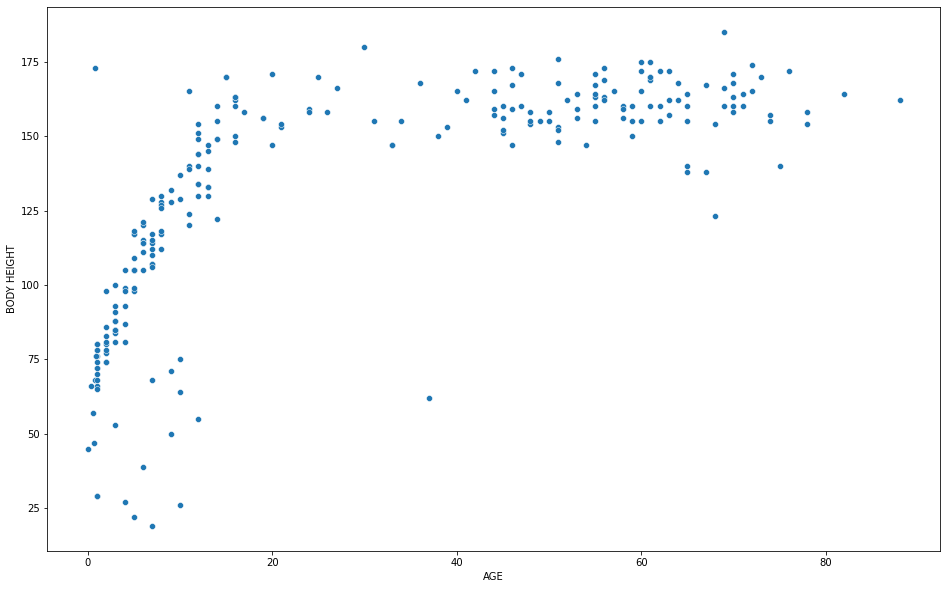

In [111]:
scatter('AGE', 'BODY HEIGHT')
#Similarly body weight increases exponentially upto the age of 20 and then it reaches saturation level.

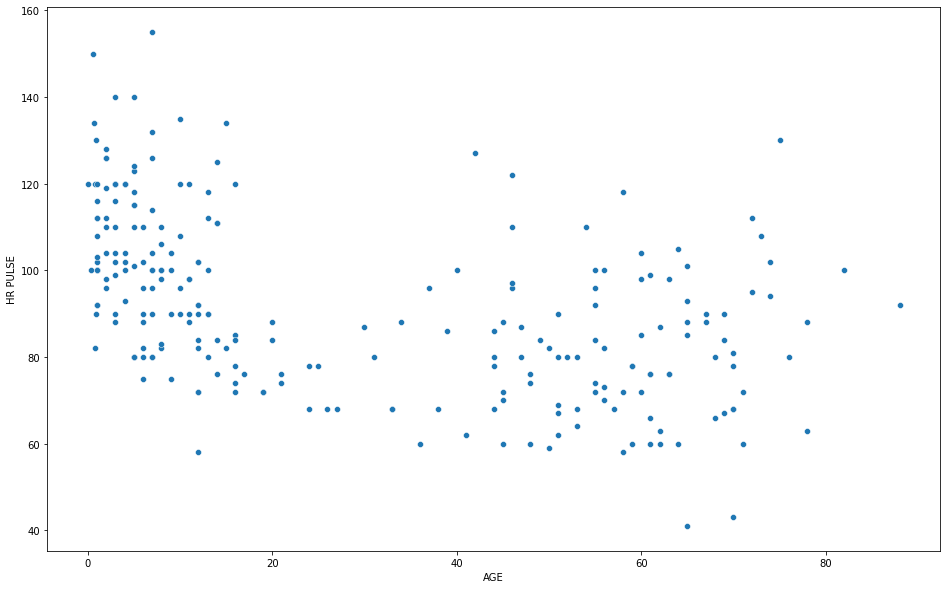

In [113]:
scatter('AGE', 'HR PULSE')
#Higher the age, lower the HR Pulse

In [114]:
df['BP -HIGH']

0      100.0
1       70.0
2      110.0
3      110.0
4      180.0
       ...  
243    130.0
244    100.0
245    150.0
246    100.0
247    130.0
Name: BP -HIGH, Length: 248, dtype: float64

In [116]:
def group(x, y):
    group = df.groupby(x)[y].mean()
    plt.figure(figsize=(16,10))
    sns.barplot(x = group.index, y = group.values)

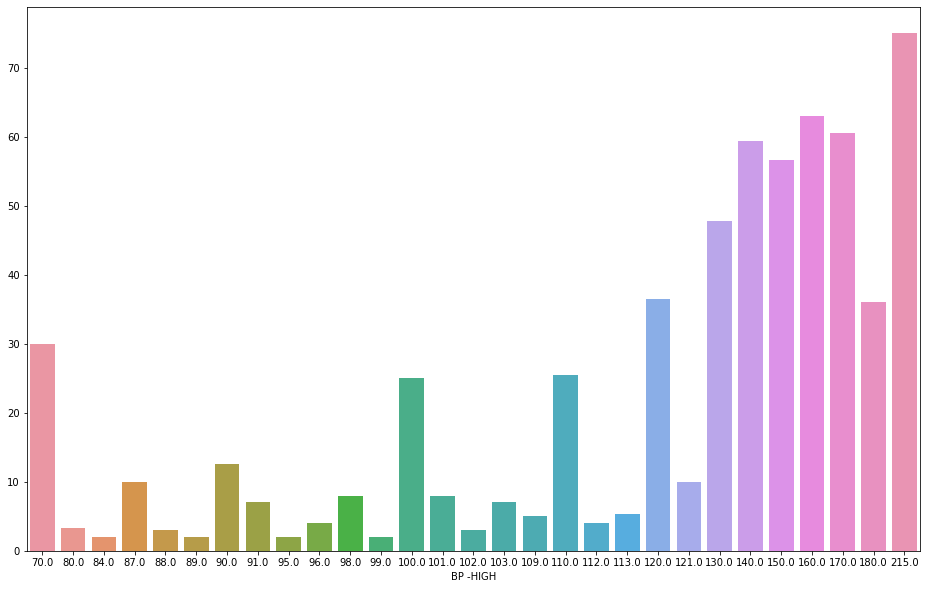

In [119]:
group('BP -HIGH', 'AGE')
#High BP patients belongs to high age group.

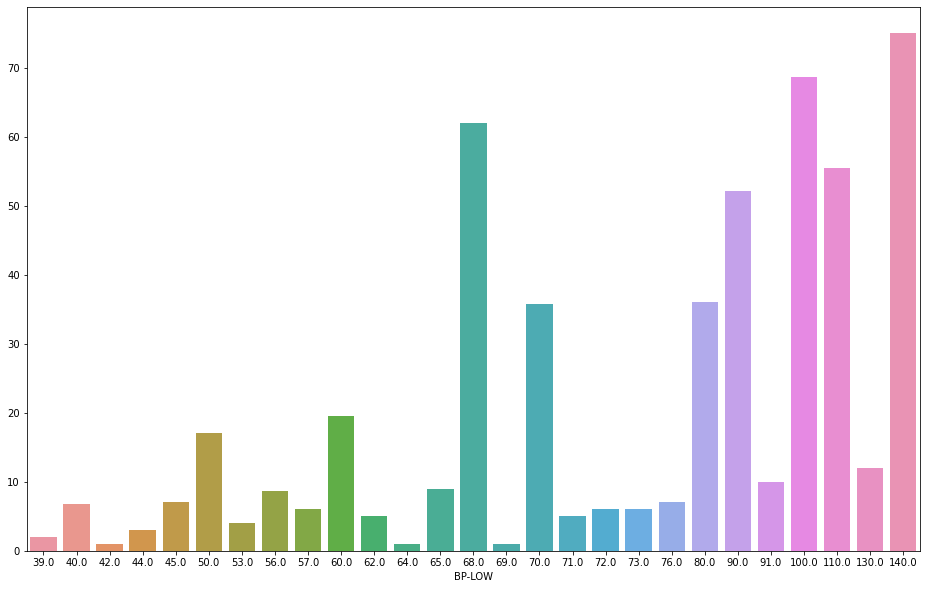

In [122]:
group('BP-LOW', 'AGE')
#Higher the age, higher the bp range.

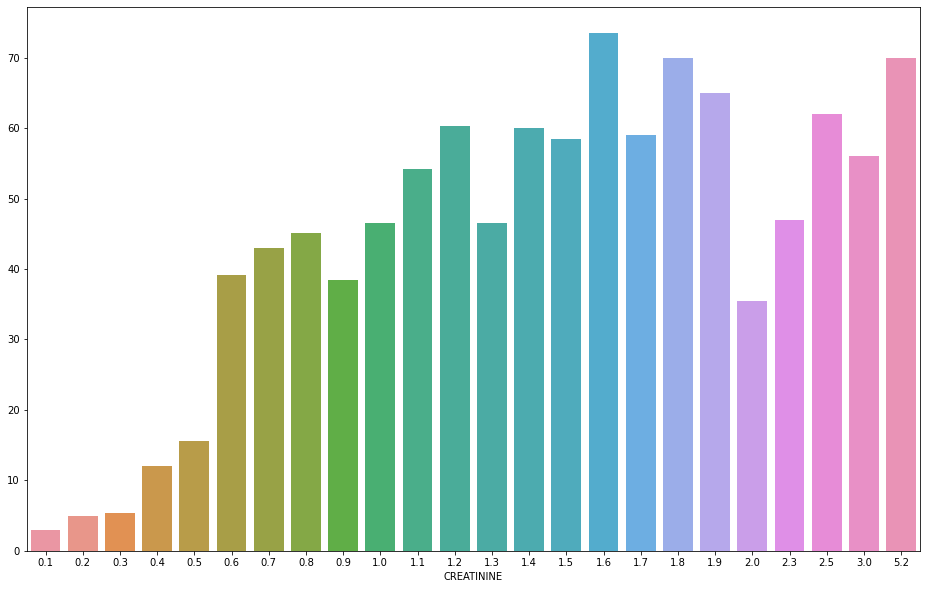

In [126]:
group('CREATININE', 'AGE')
#Higher the age, higher the creatinine level.

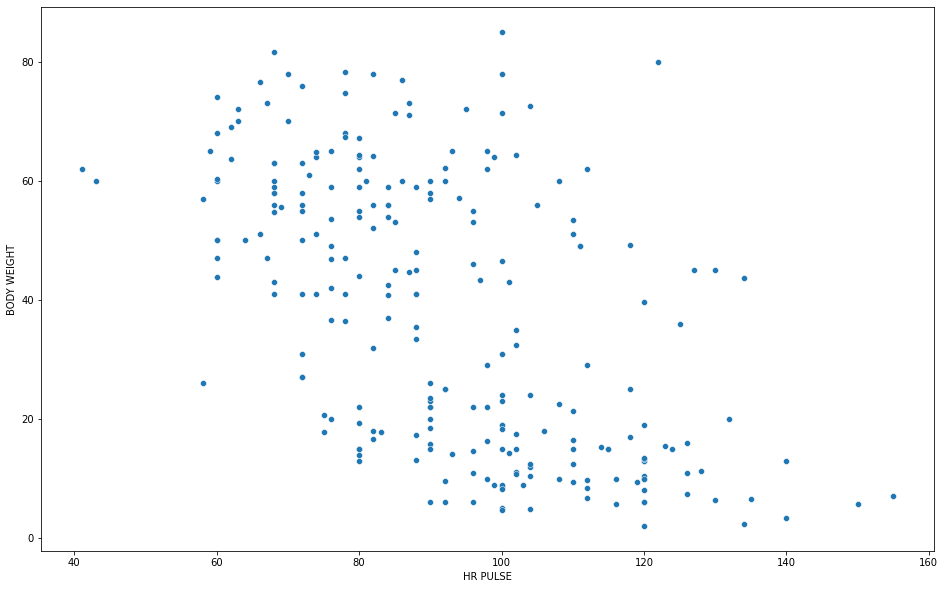

In [127]:
scatter('HR PULSE', 'BODY WEIGHT')
#Higher the HR Pulse, lower the body weight.

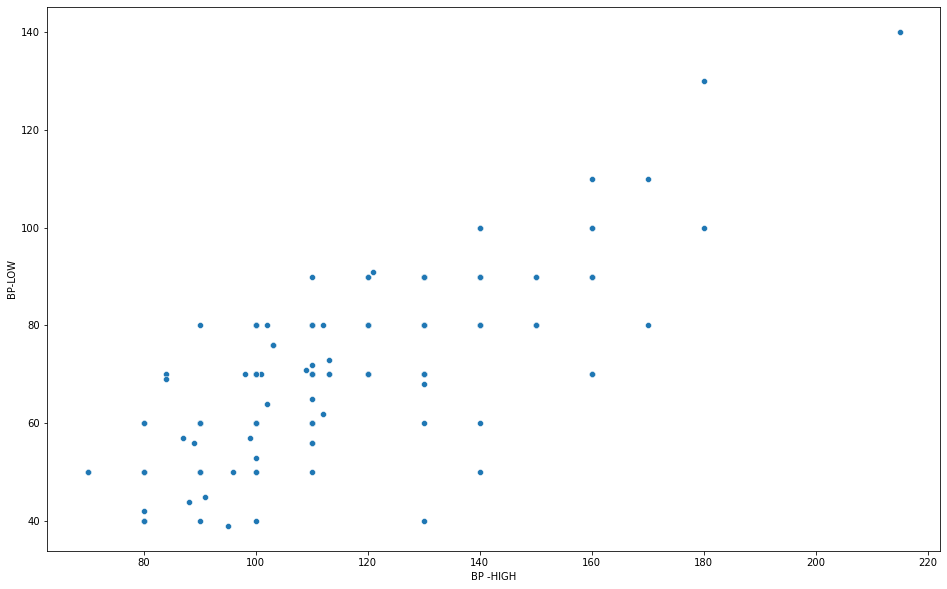

In [131]:
scatter('BP -HIGH', 'BP-LOW')

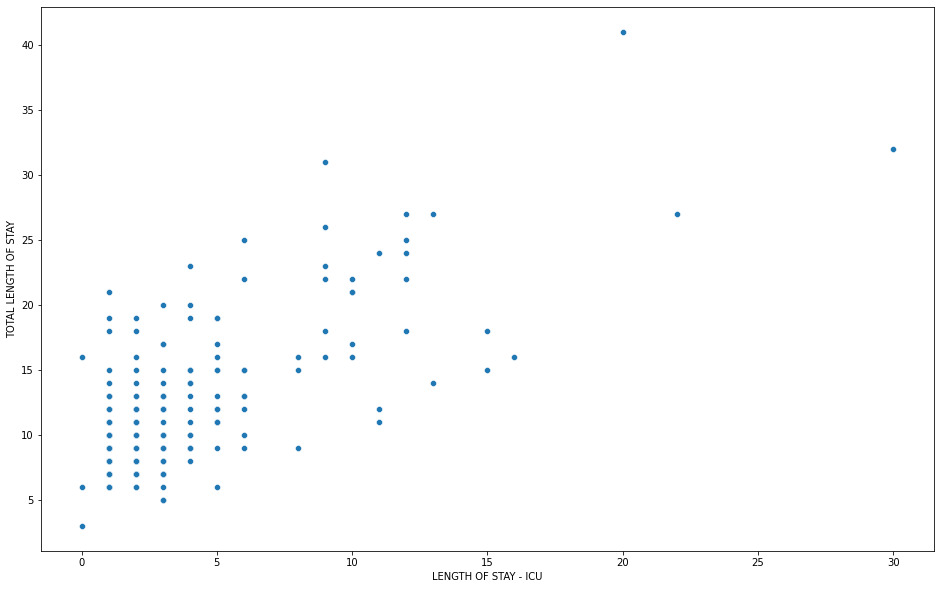

In [137]:
scatter('LENGTH OF STAY - ICU', 'TOTAL LENGTH OF STAY')
#Higher the total length of stay, higher the length of stay in ICU

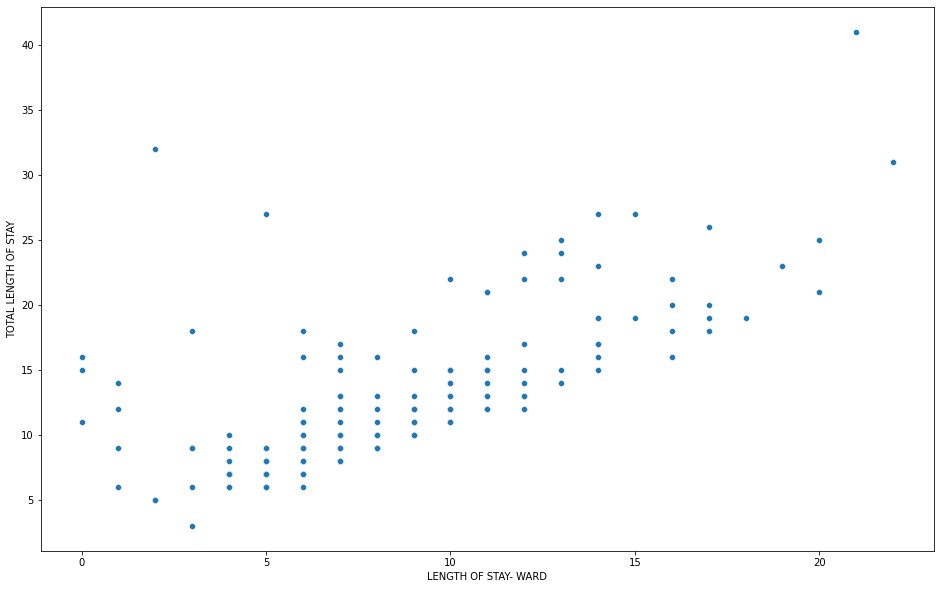

In [136]:
scatter('LENGTH OF STAY- WARD', 'TOTAL LENGTH OF STAY')
# Higher the length of stay ward, higher the total length of stay.

In [159]:
profile = ProfileReport(df)

In [161]:
profile

### Feature Engineering

In [158]:
(df['AGE']>=20).sum()

115

In [132]:
df['KEY COMPLAINTS -CODE'].mode()[0]

'other- heart'

In [26]:
df['KEY COMPLAINTS -CODE'].fillna(df['KEY COMPLAINTS -CODE'].mode()[0], inplace = True)

In [22]:
df['BP -HIGH'].mean()

115.02222222222223

In [42]:
df['BP -HIGH'].fillna(df['BP -HIGH'].mean(), inplace=True)

In [28]:
df['BP-LOW'].fillna(df['BP-LOW'].mean(), inplace=True)

In [30]:
df['PAST MEDICAL HISTORY CODE'].mode()

0    hypertension1
dtype: object

In [31]:
df['PAST MEDICAL HISTORY CODE'].fillna(df['PAST MEDICAL HISTORY CODE'].mode()[0], inplace = True)

In [33]:
df['HB'].mean()

12.894552845528455

In [34]:
df['HB'].fillna(df['HB'].mean(), inplace=True)

In [36]:
df['UREA'].mean()

26.581702127659575

In [37]:
df['UREA'].fillna(df['UREA'].mean(), inplace=True)

In [39]:
df['CREATININE'].mean()

0.7469767441860476

In [40]:
df['CREATININE'].fillna(df['CREATININE'].mean(), inplace=True)

In [43]:
df.isna().sum()

SL.                             0
AGE                             0
GENDER                          0
MARITAL STATUS                  0
KEY COMPLAINTS -CODE            0
BODY WEIGHT                     0
BODY HEIGHT                     0
HR PULSE                        0
BP -HIGH                        0
BP-LOW                          0
RR                              0
PAST MEDICAL HISTORY CODE       0
HB                              0
UREA                            0
CREATININE                      0
MODE OF ARRIVAL                 0
STATE AT THE TIME OF ARRIVAL    0
TYPE OF ADMSN                   0
TOTAL LENGTH OF STAY            0
LENGTH OF STAY - ICU            0
LENGTH OF STAY- WARD            0
IMPLANT USED (Y/N)              0
COST OF IMPLANT                 0
TOTAL COST TO HOSPITAL          0
dtype: int64

In [137]:
corr = df.corr()

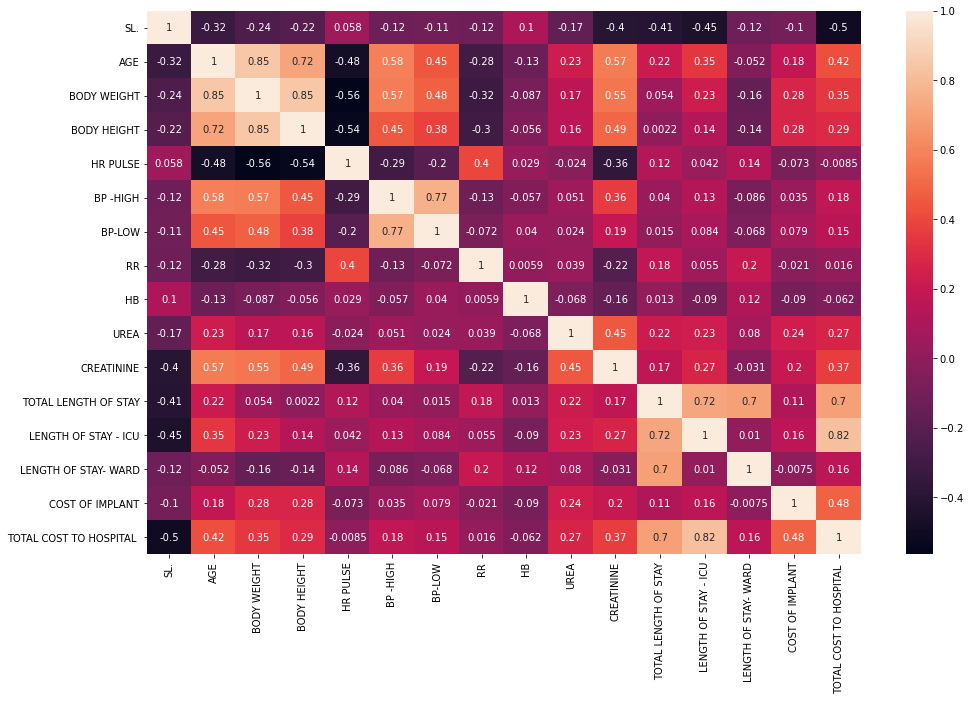

In [138]:
plt.figure(figsize=(16,10))
sns.heatmap(corr, annot=True, linecolor='w');

In [181]:
col = ['SL.','BODY WEIGHT', 'BP-LOW','BODY HEIGHT', 'TOTAL LENGTH OF STAY']

In [182]:
df_drop = df.drop(col, axis=1)

In [183]:
data = pd.get_dummies(df)

In [184]:
data_drop = pd.get_dummies(df_drop)

In [185]:
pd.set_option('display.max_columns', None)

In [186]:
data

,SL.,AGE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,HB,UREA,CREATININE,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,COST OF IMPLANT,TOTAL COST TO HOSPITAL,GENDER_F,GENDER_M,MARITAL STATUS_MARRIED,MARITAL STATUS_UNMARRIED,KEY COMPLAINTS -CODE_ACHD,KEY COMPLAINTS -CODE_CAD-DVD,KEY COMPLAINTS -CODE_CAD-SVD,KEY COMPLAINTS -CODE_CAD-TVD,KEY COMPLAINTS -CODE_CAD-VSD,KEY COMPLAINTS -CODE_OS-ASD,KEY COMPLAINTS -CODE_PM-VSD,KEY COMPLAINTS -CODE_RHD,KEY COMPLAINTS -CODE_other- heart,KEY COMPLAINTS -CODE_other- respiratory,KEY COMPLAINTS -CODE_other-general,KEY COMPLAINTS -CODE_other-nervous,KEY COMPLAINTS -CODE_other-tertalogy,PAST MEDICAL HISTORY CODE_Diabetes1,PAST MEDICAL HISTORY CODE_Diabetes2,PAST MEDICAL HISTORY CODE_Hypertension1,PAST MEDICAL HISTORY CODE_hypertension1,PAST MEDICAL HISTORY CODE_hypertension2,PAST MEDICAL HISTORY CODE_hypertension3,PAST MEDICAL HISTORY CODE_other,MODE OF ARRIVAL_AMBULANCE,MODE OF ARRIVAL_TRANSFERRED,MODE OF ARRIVAL_WALKED IN,STATE AT THE TIME OF ARRIVAL_ALERT,STATE AT THE TIME OF ARRIVAL_CONFUSED,TYPE OF ADMSN_ELECTIVE,TYPE OF ADMSN_EMERGENCY,IMPLANT USED (Y/N)_N,IMPLANT USED (Y/N)_Y
0,1,58.0,49.2,160,118,100.0,80.0,32,11.4,33.0,0.8,25,12,13,38000,660293.0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1
1,2,59.0,41.0,155,78,70.0,50.0,28,11.4,95.0,1.7,41,20,21,39690,809130.0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1
2,3,82.0,46.6,164,100,110.0,80.0,20,11.8,15.0,0.8,18,9,9,0,362231.0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,1,0,1,0
3,4,46.0,80.0,173,122,110.0,80.0,24,11.8,74.0,1.5,14,13,1,89450,629990.0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1
4,5,60.0,58.0,175,72,180.0,100.0,18,10.0,48.0,1.9,24,12,12,0,444876.0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,244,51.0,69.0,176,62,130.0,90.0,24,13.2,26.0,1.1,10,3,7,35000,295155.0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,1
244,245,58.0,57.0,159,58,100.0,70.0,24,10.6,15.0,0.8,11,2,9,26000,200321.0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,0,0,1
245,246,44.0,58.0,159,68,150.0,90.0,24,15.2,23.0,0.9,13,5,8,0,191188.0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,1,0
246,247,60.0,65.0,165,98,100.0,60.0,17,14.5,36.0,1.0,9,6,3,0,202807.0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0


In [187]:
sc = StandardScaler()

In [188]:
y = data['TOTAL COST TO HOSPITAL ']

In [189]:
X = data.drop('TOTAL COST TO HOSPITAL ', axis=1)

In [190]:
X_drop = data_drop.drop('TOTAL COST TO HOSPITAL ', axis=1)

Y_drop = data_drop['TOTAL COST TO HOSPITAL ']

In [191]:
X_scaled = pd.DataFrame(sc.fit_transform(X), columns=X.columns)

In [192]:
X_drop_scaled =  pd.DataFrame(sc.fit_transform(X_drop), columns=X_drop.columns)

#### Spliting

In [193]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [194]:
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(X_drop_scaled, y, test_size=0.3, random_state=123)

#### Modelling

In [69]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor, I
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score
from sklearn.svm import SVR
import warnings
warnings.filterwarnings('ignore')

In [62]:
def metrics(y_true, y_pred):
    print('MAE:', mean_absolute_error(y_true, y_pred))
    print('MAPE:', mean_absolute_percentage_error(y_true, y_pred))
    print('MSE:', mean_squared_error(y_true, y_pred))
    print('RSME:', np.sqrt(mean_squared_error(y_true, y_pred)))
    print('R2 Score:', r2_score(y_true, y_pred))
    
def predictions(model, X_train = X_train, X_test = X_test, y_train = y_train, y_test = y_test):
    
    model.fit(X_train, y_train)
    
    train_pred = model.predict(X_train)
    
    test_pred = model.predict(X_test)
    
    actual = [y_train, y_test]
    
    pred = [train_pred, test_pred]
    
    data = ['Train', 'Test']
    
    for i in range(2):
        
        print(data[i],'\n')
        
        metrics(actual[i], pred[i])

#### Linear Regresion

In [64]:
lr = LinearRegression()

In [68]:
y_test.mean()

187875.76466666666

In [67]:
predictions(lr)

Train 

MAE: 26256.167142427832
MAPE: 0.128081333455522
MSE: 1846455481.1717098
RSME: 42970.40238549913
R2 Score: 0.8897347739996188
Test 

MAE: 35096.23735663518
MAPE: 0.21041611057161083
MSE: 2352443855.9329777
RSME: 48501.998473598775
R2 Score: 0.7800641053903145


In [195]:
predictions(lr, X_train_d, X_test_d, y_train_d, y_test_d)

Train 

MAE: 27563.51799726018
MAPE: 0.13682956923079678
MSE: 2025053055.8889897
RSME: 45000.58950601636
R2 Score: 0.8790694196815042
Test 

MAE: 35053.7978566474
MAPE: 0.21575650770126767
MSE: 2155362635.2612066
RSME: 46425.883246969104
R2 Score: 0.7984897245479815


#### Lasso

In [70]:
ls = Lasso()
predictions(ls)

Train 

MAE: 26262.60358563858
MAPE: 0.12821279573659863
MSE: 1846581479.661422
RSME: 42971.8684683529
R2 Score: 0.8897272497175087
Test 

MAE: 35044.43320452568
MAPE: 0.20969410932801935
MSE: 2346477866.507358
RSME: 48440.45691885408
R2 Score: 0.7806218807515612


In [196]:
predictions(ls, X_train_d, X_test_d, y_train_d, y_test_d)

Train 

MAE: 27555.358844066857
MAPE: 0.13679691082474724
MSE: 2025097335.4925623
RSME: 45001.08149247707
R2 Score: 0.8790667754257695
Test 

MAE: 35071.21639499769
MAPE: 0.21591516899076357
MSE: 2157597549.654171
RSME: 46449.94671314673
R2 Score: 0.7982807767785574


#### Ridge

In [71]:
ri = Ridge()
predictions(ri)

Train 

MAE: 26804.08813463882
MAPE: 0.13487977654797043
MSE: 1906838671.7389975
RSME: 43667.36392019786
R2 Score: 0.886128856487705
Test 

MAE: 29795.32131455586
MAPE: 0.17452823512722235
MSE: 1723035426.266261
RSME: 41509.461888420825
R2 Score: 0.8389090830098657


In [197]:
predictions(ri, X_train_d, X_test_d, y_train_d, y_test_d)

Train 

MAE: 27525.729501719048
MAPE: 0.13687013243495666
MSE: 2026023153.24726
RSME: 45011.36693377863
R2 Score: 0.8790114881442737
Test 

MAE: 34699.248496555025
MAPE: 0.2132951058615914
MSE: 2113776837.133686
RSME: 45975.828835744614
R2 Score: 0.8023776854407216


#### Elastic Net

In [72]:
el = ElasticNet()
predictions(el)

Train 

MAE: 29318.867015399857
MAPE: 0.15750647631241319
MSE: 2491318516.225202
RSME: 49913.10966294529
R2 Score: 0.8512253330601907
Test 

MAE: 25415.479933924056
MAPE: 0.1653575461106671
MSE: 1072703009.3931755
RSME: 32752.14511132325
R2 Score: 0.8997102968360442


In [162]:
predictions(el, X_train_d, X_test_d, y_train_d, y_test_d)

Train 

MAE: 32538.783272762335
MAPE: 0.17467306107335112
MSE: 3133057676.572782
RSME: 55973.72309014992
R2 Score: 0.8129024412977977
Test 

MAE: 35226.113554730735
MAPE: 0.23738703148897686
MSE: 2204019106.1940684
RSME: 46946.981864589216
R2 Score: 0.7939407086655493


#### SVM

In [73]:
svm = SVR()

predictions(svm)

Train 

MAE: 76874.23567036873
MAPE: 0.36482451990894776
MSE: 18241391277.902863
RSME: 135060.69479275923
R2 Score: -0.08932554958918892
Test 

MAE: 70676.25175895492
MAPE: 0.39147315185924886
MSE: 11230081361.1446
RSME: 105972.07821470994
R2 Score: -0.04992856023904224


In [164]:
predictions(svm, X_train_d, X_test_d, y_train_d, y_test_d)

Train 

MAE: 76878.24145249224
MAPE: 0.3648293063644489
MSE: 18242784541.62672
RSME: 135065.85261133444
R2 Score: -0.08940875145403537
Test 

MAE: 70678.67878889255
MAPE: 0.3914700009902881
MSE: 11231512263.34738
RSME: 105978.82931674315
R2 Score: -0.05006233888599021


#### KNN

In [74]:
knn = KNeighborsRegressor()

predictions(knn)

Train 

MAE: 42797.767537572254
MAPE: 0.21498234232063065
MSE: 5328105363.734529
RSME: 72993.87209714613
R2 Score: 0.6818202507036795
Test 

MAE: 43627.9124
MAPE: 0.27645566059473453
MSE: 4244050252.1363964
RSME: 65146.375587106886
R2 Score: 0.6032130643126927


In [165]:
predictions(knn, X_train_d, X_test_d, y_train_d, y_test_d)

Train 

MAE: 47655.36686705203
MAPE: 0.2376451722709426
MSE: 6451573037.317036
RSME: 80321.68472658574
R2 Score: 0.614729861471502
Test 

MAE: 52982.92477333333
MAPE: 0.3030638086573779
MSE: 6225800613.204821
RSME: 78903.74270720509
R2 Score: 0.41793423716644806


#### Decision Tree

In [75]:
dtree = DecisionTreeRegressor()

predictions(dtree)

Train 

MAE: 0.0
MAPE: 0.0
MSE: 0.0
RSME: 0.0
R2 Score: 1.0
Test 

MAE: 44669.26093333333
MAPE: 0.27787519963708557
MSE: 4490848108.513907
RSME: 67013.79043535671
R2 Score: 0.5801393118007062


In [166]:
predictions(dtree, X_train_d, X_test_d, y_train_d, y_test_d)

Train 

MAE: 0.0
MAPE: 0.0
MSE: 0.0
RSME: 0.0
R2 Score: 1.0
Test 

MAE: 60609.810533333344
MAPE: 0.2984418004132723
MSE: 12805418985.57851
RSME: 113161.03121471858
R2 Score: -0.19721083814265583


#### Bagging Regressor

In [76]:
bag = BaggingRegressor()
predictions(bag)

Train 

MAE: 14596.536647398843
MAPE: 0.07864826966770314
MSE: 746537439.2375195
RSME: 27322.83732040872
R2 Score: 0.955418844215494
Test 

MAE: 30398.641413333335
MAPE: 0.20188154883520182
MSE: 1852635420.2599647
RSME: 43042.251570520384
R2 Score: 0.8267924535104931


#### Random Forest

In [77]:
ran = RandomForestRegressor()

predictions(ran)

Train 

MAE: 13440.977246820808
MAPE: 0.06922732353108271
MSE: 589964640.6800026
RSME: 24289.187731993068
R2 Score: 0.9647689396792098
Test 

MAE: 32909.287109333345
MAPE: 0.21384077296416487
MSE: 2234638190.0356545
RSME: 47271.95987089656
R2 Score: 0.7910780534825812


#### ADA Boost

In [78]:
ada = AdaBoostRegressor()

predictions(ada)

Train 

MAE: 21734.091386477772
MAPE: 0.1487455879841437
MSE: 725704512.4234257
RSME: 26938.903326294218
R2 Score: 0.9566629291159042
Test 

MAE: 32488.379714565766
MAPE: 0.20470661480585983
MSE: 3422175427.895732
RSME: 58499.36262811529
R2 Score: 0.6800522093875745


#### Gradient Boost

In [79]:
grad = GradientBoostingRegressor()

predictions(grad)

Train 

MAE: 7499.701111934845
MAPE: 0.05080993315118985
MSE: 88871251.01753236
RSME: 9427.154980031482
R2 Score: 0.9946928541314376
Test 

MAE: 29782.342357776277
MAPE: 0.1911274596999689
MSE: 2448275328.707087
RSME: 49480.04980501826
R2 Score: 0.7711045798980564


#### LGBM

In [80]:
lgbm = LGBMRegressor()
predictions(lgbm)

Train 

MAE: 21147.96099587732
MAPE: 0.10562915137466579
MSE: 1500323984.3477814
RSME: 38734.01585619262
R2 Score: 0.9104047918323376
Test 

MAE: 38984.9577923248
MAPE: 0.23509986762285873
MSE: 3436731299.717175
RSME: 58623.64113322521
R2 Score: 0.6786913443098389


#### XG Boost

In [82]:
xg = XGBRegressor()

predictions(xg)

Train 

MAE: 2.1752420520236915
MAPE: 1.505472920868649e-05
MSE: 11.725865868861018
RSME: 3.4243051658491273
R2 Score: 0.9999999992997637
Test 

MAE: 35851.38492708333
MAPE: 0.22870442802489174
MSE: 2513438951.3613696
RSME: 50134.209392004675
R2 Score: 0.7650122688708103


#### CAT Boost

In [83]:
cat = CatBoostRegressor()
predictions(cat)

Learning rate set to 0.028561
0:	learn: 127781.8831957	total: 68.6ms	remaining: 1m 8s
1:	learn: 126610.2795999	total: 71.1ms	remaining: 35.5s
2:	learn: 124975.3835205	total: 73.6ms	remaining: 24.5s
3:	learn: 123482.7048217	total: 76.5ms	remaining: 19.1s
4:	learn: 121912.6108366	total: 79.2ms	remaining: 15.8s
5:	learn: 120455.8056708	total: 82.5ms	remaining: 13.7s
6:	learn: 118979.2509239	total: 85.5ms	remaining: 12.1s
7:	learn: 117385.1196564	total: 88.1ms	remaining: 10.9s
8:	learn: 116306.2081337	total: 90.6ms	remaining: 9.97s
9:	learn: 114953.0165463	total: 93.2ms	remaining: 9.22s
10:	learn: 113713.8452226	total: 95.6ms	remaining: 8.6s
11:	learn: 112487.6501503	total: 98.6ms	remaining: 8.12s
12:	learn: 111236.7285193	total: 102ms	remaining: 7.76s
13:	learn: 109880.9346280	total: 105ms	remaining: 7.38s
14:	learn: 108605.5368931	total: 107ms	remaining: 7.06s
15:	learn: 107060.5696737	total: 110ms	remaining: 6.76s
16:	learn: 105966.9925203	total: 112ms	remaining: 6.49s
17:	learn: 104828

184:	learn: 29978.7174891	total: 679ms	remaining: 2.99s
185:	learn: 29870.9467693	total: 682ms	remaining: 2.98s
186:	learn: 29778.8241384	total: 684ms	remaining: 2.97s
187:	learn: 29620.0117840	total: 686ms	remaining: 2.96s
188:	learn: 29472.8799872	total: 689ms	remaining: 2.96s
189:	learn: 29372.1397967	total: 699ms	remaining: 2.98s
190:	learn: 29226.4079679	total: 703ms	remaining: 2.98s
191:	learn: 29049.7568044	total: 707ms	remaining: 2.98s
192:	learn: 28892.8181114	total: 712ms	remaining: 2.98s
193:	learn: 28701.3822948	total: 718ms	remaining: 2.98s
194:	learn: 28494.1798173	total: 721ms	remaining: 2.98s
195:	learn: 28411.4005467	total: 724ms	remaining: 2.97s
196:	learn: 28248.6393912	total: 729ms	remaining: 2.97s
197:	learn: 28096.0413659	total: 731ms	remaining: 2.96s
198:	learn: 28005.3020693	total: 733ms	remaining: 2.95s
199:	learn: 27887.1548805	total: 735ms	remaining: 2.94s
200:	learn: 27793.3192264	total: 751ms	remaining: 2.98s
201:	learn: 27618.8700811	total: 760ms	remaining

362:	learn: 15092.3674979	total: 1.72s	remaining: 3.02s
363:	learn: 15013.1007738	total: 1.77s	remaining: 3.09s
364:	learn: 14944.7760522	total: 1.77s	remaining: 3.09s
365:	learn: 14872.8933934	total: 1.78s	remaining: 3.09s
366:	learn: 14786.6037489	total: 1.79s	remaining: 3.08s
367:	learn: 14711.8008897	total: 1.79s	remaining: 3.07s
368:	learn: 14699.9537546	total: 1.79s	remaining: 3.06s
369:	learn: 14643.9623115	total: 1.79s	remaining: 3.05s
370:	learn: 14574.4036182	total: 1.8s	remaining: 3.04s
371:	learn: 14512.3707817	total: 1.8s	remaining: 3.04s
372:	learn: 14421.9745163	total: 1.8s	remaining: 3.03s
373:	learn: 14370.5164237	total: 1.81s	remaining: 3.02s
374:	learn: 14349.2261557	total: 1.81s	remaining: 3.02s
375:	learn: 14300.7869089	total: 1.81s	remaining: 3.01s
376:	learn: 14254.4244048	total: 1.82s	remaining: 3s
377:	learn: 14186.5861996	total: 1.82s	remaining: 3s
378:	learn: 14129.8259324	total: 1.83s	remaining: 3s
379:	learn: 14079.1712905	total: 1.84s	remaining: 3s
380:	le

513:	learn: 9475.7815639	total: 2.25s	remaining: 2.13s
514:	learn: 9435.7738323	total: 2.25s	remaining: 2.12s
515:	learn: 9393.1818394	total: 2.25s	remaining: 2.11s
516:	learn: 9349.5284235	total: 2.26s	remaining: 2.11s
517:	learn: 9309.4346063	total: 2.26s	remaining: 2.1s
518:	learn: 9267.8279980	total: 2.26s	remaining: 2.1s
519:	learn: 9211.2252277	total: 2.27s	remaining: 2.09s
520:	learn: 9187.1612053	total: 2.27s	remaining: 2.08s
521:	learn: 9151.8150227	total: 2.27s	remaining: 2.08s
522:	learn: 9116.8893969	total: 2.27s	remaining: 2.07s
523:	learn: 9088.1747476	total: 2.28s	remaining: 2.07s
524:	learn: 9061.3787229	total: 2.28s	remaining: 2.06s
525:	learn: 9030.6368179	total: 2.28s	remaining: 2.06s
526:	learn: 9024.4026911	total: 2.29s	remaining: 2.05s
527:	learn: 9007.1702009	total: 2.29s	remaining: 2.04s
528:	learn: 9002.3160551	total: 2.29s	remaining: 2.04s
529:	learn: 8962.5265652	total: 2.3s	remaining: 2.04s
530:	learn: 8946.1322033	total: 2.3s	remaining: 2.03s
531:	learn: 89

669:	learn: 5966.7748163	total: 2.79s	remaining: 1.37s
670:	learn: 5935.9364917	total: 2.79s	remaining: 1.37s
671:	learn: 5924.8540811	total: 2.79s	remaining: 1.36s
672:	learn: 5911.9417655	total: 2.8s	remaining: 1.36s
673:	learn: 5896.6908489	total: 2.8s	remaining: 1.35s
674:	learn: 5878.2893316	total: 2.8s	remaining: 1.35s
675:	learn: 5874.9509935	total: 2.8s	remaining: 1.34s
676:	learn: 5872.7812464	total: 2.81s	remaining: 1.34s
677:	learn: 5852.8185612	total: 2.83s	remaining: 1.34s
678:	learn: 5839.4075059	total: 2.84s	remaining: 1.34s
679:	learn: 5808.6741692	total: 2.84s	remaining: 1.34s
680:	learn: 5784.8908072	total: 2.84s	remaining: 1.33s
681:	learn: 5759.8785382	total: 2.84s	remaining: 1.33s
682:	learn: 5747.4169756	total: 2.85s	remaining: 1.32s
683:	learn: 5729.1384131	total: 2.85s	remaining: 1.32s
684:	learn: 5709.7215601	total: 2.85s	remaining: 1.31s
685:	learn: 5681.6257497	total: 2.85s	remaining: 1.31s
686:	learn: 5649.0237041	total: 2.86s	remaining: 1.3s
687:	learn: 562

848:	learn: 3692.7555455	total: 3.32s	remaining: 590ms
849:	learn: 3683.2553286	total: 3.33s	remaining: 588ms
850:	learn: 3666.6967111	total: 3.33s	remaining: 584ms
851:	learn: 3651.1348593	total: 3.34s	remaining: 580ms
852:	learn: 3640.4896969	total: 3.35s	remaining: 577ms
853:	learn: 3628.7293027	total: 3.36s	remaining: 574ms
854:	learn: 3620.5376195	total: 3.36s	remaining: 571ms
855:	learn: 3612.1591867	total: 3.37s	remaining: 567ms
856:	learn: 3610.8642056	total: 3.37s	remaining: 563ms
857:	learn: 3594.2871078	total: 3.38s	remaining: 560ms
858:	learn: 3587.0270919	total: 3.4s	remaining: 559ms
859:	learn: 3578.5458162	total: 3.42s	remaining: 557ms
860:	learn: 3569.2404285	total: 3.45s	remaining: 557ms
861:	learn: 3567.9709696	total: 3.46s	remaining: 554ms
862:	learn: 3566.6172790	total: 3.46s	remaining: 550ms
863:	learn: 3551.9375986	total: 3.47s	remaining: 546ms
864:	learn: 3549.5574887	total: 3.47s	remaining: 542ms
865:	learn: 3540.8731273	total: 3.47s	remaining: 538ms
866:	learn:

Train 

MAE: 1963.9701903691846
MAPE: 0.013276526628004014
MSE: 6171792.871333245
RSME: 2484.3093348722186
R2 Score: 0.9996314375609244
Test 

MAE: 25695.507408215082
MAPE: 0.19127963572197812
MSE: 1311035382.737259
RSME: 36208.22258461825
R2 Score: 0.8774280036311797


#### GRid Search CV

In [84]:

params = {
    'learning_rate' : [0.05, 0.10, 0.15, 0.20],
    'max_depth' : [3, 4, 5],
    'min_child_samples': [1, 3, 5],
    'l2_leaf_reg':[5,10,15]
    
}

In [88]:
grid = GridSearchCV(cat, param_grid=params, n_jobs=-1, verbose=3, cv=2)

In [89]:
grid.fit(X_train, y_train)

Fitting 2 folds for each of 108 candidates, totalling 216 fits
0:	learn: 126613.7121323	total: 1.03ms	remaining: 1.03s
1:	learn: 124970.1582587	total: 4.04ms	remaining: 2.02s
2:	learn: 122308.7309612	total: 7.91ms	remaining: 2.63s
3:	learn: 120540.7259893	total: 8.85ms	remaining: 2.2s
4:	learn: 118362.7534248	total: 9.74ms	remaining: 1.94s
5:	learn: 116432.3227993	total: 10.6ms	remaining: 1.76s
6:	learn: 114266.0415267	total: 13.3ms	remaining: 1.89s
7:	learn: 112740.9764355	total: 14.6ms	remaining: 1.8s
8:	learn: 110486.7521864	total: 17.2ms	remaining: 1.89s
9:	learn: 108675.5614276	total: 20.3ms	remaining: 2.01s
10:	learn: 106957.1496400	total: 25.8ms	remaining: 2.32s
11:	learn: 105268.5603473	total: 27.5ms	remaining: 2.26s
12:	learn: 103448.2211628	total: 28.5ms	remaining: 2.16s
13:	learn: 102448.7862966	total: 29.8ms	remaining: 2.1s
14:	learn: 101355.2318673	total: 31ms	remaining: 2.04s
15:	learn: 99613.6975328	total: 32.1ms	remaining: 1.97s
16:	learn: 98303.9583952	total: 32.9ms	re

179:	learn: 33884.5545316	total: 304ms	remaining: 1.38s
180:	learn: 33810.1737387	total: 306ms	remaining: 1.38s
181:	learn: 33678.7658270	total: 308ms	remaining: 1.38s
182:	learn: 33517.3711644	total: 310ms	remaining: 1.38s
183:	learn: 33279.0844534	total: 311ms	remaining: 1.38s
184:	learn: 33207.9470435	total: 319ms	remaining: 1.4s
185:	learn: 33123.9004674	total: 320ms	remaining: 1.4s
186:	learn: 33054.2105402	total: 321ms	remaining: 1.4s
187:	learn: 32960.3738132	total: 323ms	remaining: 1.39s
188:	learn: 32892.7072569	total: 324ms	remaining: 1.39s
189:	learn: 32723.4587980	total: 325ms	remaining: 1.39s
190:	learn: 32571.9382118	total: 326ms	remaining: 1.38s
191:	learn: 32359.2771472	total: 326ms	remaining: 1.37s
192:	learn: 32206.6045200	total: 327ms	remaining: 1.37s
193:	learn: 32094.5717440	total: 329ms	remaining: 1.36s
194:	learn: 31896.9958154	total: 331ms	remaining: 1.36s
195:	learn: 31821.2592657	total: 332ms	remaining: 1.36s
196:	learn: 31717.1764283	total: 334ms	remaining: 1

406:	learn: 21027.8634668	total: 619ms	remaining: 902ms
407:	learn: 21003.7195776	total: 620ms	remaining: 900ms
408:	learn: 20995.8204296	total: 622ms	remaining: 899ms
409:	learn: 20932.5444789	total: 623ms	remaining: 896ms
410:	learn: 20853.0811131	total: 625ms	remaining: 895ms
411:	learn: 20845.3024209	total: 626ms	remaining: 893ms
412:	learn: 20776.7306985	total: 627ms	remaining: 891ms
413:	learn: 20769.8014811	total: 627ms	remaining: 888ms
414:	learn: 20761.0837866	total: 628ms	remaining: 886ms
415:	learn: 20749.4196119	total: 629ms	remaining: 884ms
416:	learn: 20741.7893770	total: 630ms	remaining: 881ms
417:	learn: 20686.0786018	total: 631ms	remaining: 879ms
418:	learn: 20678.5415994	total: 632ms	remaining: 876ms
419:	learn: 20658.2535051	total: 633ms	remaining: 874ms
420:	learn: 20650.7909561	total: 633ms	remaining: 871ms
421:	learn: 20627.0043182	total: 634ms	remaining: 869ms
422:	learn: 20619.6219125	total: 635ms	remaining: 866ms
423:	learn: 20608.3313951	total: 636ms	remaining

686:	learn: 14901.5053328	total: 937ms	remaining: 427ms
687:	learn: 14896.8147731	total: 939ms	remaining: 426ms
688:	learn: 14885.2663133	total: 952ms	remaining: 430ms
689:	learn: 14880.8667788	total: 954ms	remaining: 429ms
690:	learn: 14865.6279556	total: 961ms	remaining: 430ms
691:	learn: 14854.2430368	total: 964ms	remaining: 429ms
692:	learn: 14851.1626497	total: 965ms	remaining: 427ms
693:	learn: 14840.1017366	total: 966ms	remaining: 426ms
694:	learn: 14835.5195952	total: 967ms	remaining: 424ms
695:	learn: 14826.7113775	total: 977ms	remaining: 427ms
696:	learn: 14822.1938763	total: 979ms	remaining: 426ms
697:	learn: 14807.9255447	total: 981ms	remaining: 424ms
698:	learn: 14800.4659415	total: 996ms	remaining: 429ms
699:	learn: 14778.6491711	total: 997ms	remaining: 427ms
700:	learn: 14774.1898510	total: 997ms	remaining: 425ms
701:	learn: 14738.4044838	total: 998ms	remaining: 424ms
702:	learn: 14733.9722015	total: 1s	remaining: 423ms
703:	learn: 14730.9567389	total: 1s	remaining: 421m

833:	learn: 12702.6694587	total: 1.22s	remaining: 243ms
834:	learn: 12680.3780866	total: 1.22s	remaining: 241ms
835:	learn: 12660.4942110	total: 1.22s	remaining: 240ms
836:	learn: 12635.5355082	total: 1.22s	remaining: 238ms
837:	learn: 12632.9806917	total: 1.23s	remaining: 237ms
838:	learn: 12620.2519482	total: 1.23s	remaining: 235ms
839:	learn: 12597.0986392	total: 1.24s	remaining: 236ms
840:	learn: 12593.9099788	total: 1.24s	remaining: 234ms
841:	learn: 12591.3963988	total: 1.24s	remaining: 233ms
842:	learn: 12586.1456921	total: 1.24s	remaining: 232ms
843:	learn: 12581.1156927	total: 1.25s	remaining: 230ms
844:	learn: 12576.1619356	total: 1.25s	remaining: 229ms
845:	learn: 12570.7936194	total: 1.25s	remaining: 227ms
846:	learn: 12567.7256703	total: 1.25s	remaining: 226ms
847:	learn: 12543.9634759	total: 1.25s	remaining: 224ms
848:	learn: 12541.6580416	total: 1.25s	remaining: 222ms
849:	learn: 12513.8790737	total: 1.25s	remaining: 221ms
850:	learn: 12501.9597834	total: 1.25s	remaining

GridSearchCV(cv=2,
             estimator=<catboost.core.CatBoostRegressor object at 0x7f93bb7e0160>,
             n_jobs=-1,
             param_grid={'l2_leaf_reg': [5, 10, 15],
                         'learning_rate': [0.05, 0.1, 0.15, 0.2],
                         'max_depth': [3, 4, 5],
                         'min_child_samples': [1, 3, 5]},
             verbose=3)

In [90]:
grid.best_params_

{'l2_leaf_reg': 10,
 'learning_rate': 0.05,
 'max_depth': 3,
 'min_child_samples': 1}

In [93]:
predictions(grid.best_estimator_)

0:	learn: 126613.7121323	total: 2.32ms	remaining: 2.32s
1:	learn: 124970.1582587	total: 4.92ms	remaining: 2.46s
2:	learn: 122308.7309612	total: 6.03ms	remaining: 2s
3:	learn: 120540.7259893	total: 7.16ms	remaining: 1.78s
4:	learn: 118362.7534248	total: 8.19ms	remaining: 1.63s
5:	learn: 116432.3227993	total: 9.41ms	remaining: 1.56s
6:	learn: 114266.0415267	total: 10.3ms	remaining: 1.45s
7:	learn: 112740.9764355	total: 11.4ms	remaining: 1.41s
8:	learn: 110486.7521864	total: 12.7ms	remaining: 1.4s
9:	learn: 108675.5614276	total: 14.9ms	remaining: 1.47s
10:	learn: 106957.1496400	total: 16.9ms	remaining: 1.51s
11:	learn: 105268.5603473	total: 18.6ms	remaining: 1.53s
12:	learn: 103448.2211628	total: 20.3ms	remaining: 1.54s
13:	learn: 102448.7862966	total: 21.4ms	remaining: 1.51s
14:	learn: 101355.2318673	total: 23.2ms	remaining: 1.52s
15:	learn: 99613.6975328	total: 24.3ms	remaining: 1.49s
16:	learn: 98303.9583952	total: 26.5ms	remaining: 1.53s
17:	learn: 96949.8862668	total: 27.9ms	remainin

153:	learn: 37927.2618770	total: 246ms	remaining: 1.35s
154:	learn: 37764.0346326	total: 248ms	remaining: 1.35s
155:	learn: 37468.6571003	total: 249ms	remaining: 1.35s
156:	learn: 37363.6367128	total: 251ms	remaining: 1.34s
157:	learn: 37197.7762625	total: 253ms	remaining: 1.35s
158:	learn: 37070.8102373	total: 256ms	remaining: 1.35s
159:	learn: 36923.9619760	total: 258ms	remaining: 1.36s
160:	learn: 36779.8770323	total: 262ms	remaining: 1.36s
161:	learn: 36607.4506964	total: 264ms	remaining: 1.36s
162:	learn: 36524.4808550	total: 268ms	remaining: 1.37s
163:	learn: 36387.5192342	total: 271ms	remaining: 1.38s
164:	learn: 36149.8323479	total: 272ms	remaining: 1.38s
165:	learn: 36008.1251603	total: 274ms	remaining: 1.37s
166:	learn: 35925.5860377	total: 275ms	remaining: 1.37s
167:	learn: 35820.4471539	total: 276ms	remaining: 1.37s
168:	learn: 35695.0560190	total: 278ms	remaining: 1.37s
169:	learn: 35443.0730002	total: 280ms	remaining: 1.37s
170:	learn: 35227.2707132	total: 282ms	remaining

300:	learn: 24333.7091258	total: 546ms	remaining: 1.27s
301:	learn: 24314.1860781	total: 553ms	remaining: 1.28s
302:	learn: 24278.8573655	total: 555ms	remaining: 1.28s
303:	learn: 24268.7927399	total: 557ms	remaining: 1.27s
304:	learn: 24258.2605425	total: 558ms	remaining: 1.27s
305:	learn: 24247.8011938	total: 560ms	remaining: 1.27s
306:	learn: 24208.2072335	total: 561ms	remaining: 1.27s
307:	learn: 24158.6929806	total: 567ms	remaining: 1.27s
308:	learn: 24090.3373498	total: 570ms	remaining: 1.27s
309:	learn: 24042.2137774	total: 571ms	remaining: 1.27s
310:	learn: 24028.6851418	total: 575ms	remaining: 1.27s
311:	learn: 23953.1670258	total: 582ms	remaining: 1.28s
312:	learn: 23867.4407920	total: 584ms	remaining: 1.28s
313:	learn: 23826.0103738	total: 585ms	remaining: 1.28s
314:	learn: 23789.2383873	total: 586ms	remaining: 1.27s
315:	learn: 23750.3976122	total: 588ms	remaining: 1.27s
316:	learn: 23708.6516693	total: 589ms	remaining: 1.27s
317:	learn: 23695.2139146	total: 590ms	remaining

485:	learn: 19105.1652248	total: 1.05s	remaining: 1.11s
486:	learn: 19097.0780152	total: 1.07s	remaining: 1.12s
487:	learn: 19041.1771219	total: 1.07s	remaining: 1.12s
488:	learn: 19035.3128479	total: 1.07s	remaining: 1.12s
489:	learn: 18993.8320577	total: 1.07s	remaining: 1.11s
490:	learn: 18988.0409579	total: 1.07s	remaining: 1.11s
491:	learn: 18979.2562586	total: 1.07s	remaining: 1.11s
492:	learn: 18924.9464703	total: 1.08s	remaining: 1.11s
493:	learn: 18854.7062364	total: 1.08s	remaining: 1.11s
494:	learn: 18839.3158683	total: 1.09s	remaining: 1.11s
495:	learn: 18786.1807134	total: 1.1s	remaining: 1.12s
496:	learn: 18766.6494706	total: 1.11s	remaining: 1.12s
497:	learn: 18758.1265380	total: 1.11s	remaining: 1.12s
498:	learn: 18730.8896074	total: 1.11s	remaining: 1.11s
499:	learn: 18666.8420453	total: 1.12s	remaining: 1.12s
500:	learn: 18615.9586727	total: 1.12s	remaining: 1.11s
501:	learn: 18608.1333197	total: 1.12s	remaining: 1.11s
502:	learn: 18601.2515729	total: 1.12s	remaining:

666:	learn: 15191.1191594	total: 1.65s	remaining: 822ms
667:	learn: 15186.1485214	total: 1.65s	remaining: 819ms
668:	learn: 15181.2218967	total: 1.65s	remaining: 817ms
669:	learn: 15168.4743165	total: 1.65s	remaining: 814ms
670:	learn: 15165.1685044	total: 1.65s	remaining: 811ms
671:	learn: 15161.1026731	total: 1.67s	remaining: 814ms
672:	learn: 15156.2524438	total: 1.67s	remaining: 811ms
673:	learn: 15110.8027369	total: 1.67s	remaining: 809ms
674:	learn: 15107.5590401	total: 1.67s	remaining: 806ms
675:	learn: 15076.4218402	total: 1.68s	remaining: 804ms
676:	learn: 15026.0437921	total: 1.68s	remaining: 801ms
677:	learn: 15017.8161652	total: 1.68s	remaining: 799ms
678:	learn: 14996.9538739	total: 1.69s	remaining: 797ms
679:	learn: 14989.0297270	total: 1.69s	remaining: 795ms
680:	learn: 14967.9260051	total: 1.69s	remaining: 793ms
681:	learn: 14943.2526421	total: 1.69s	remaining: 790ms
682:	learn: 14932.7675576	total: 1.7s	remaining: 787ms
683:	learn: 14927.9845993	total: 1.7s	remaining: 

855:	learn: 12417.4592446	total: 2.27s	remaining: 382ms
856:	learn: 12412.6145133	total: 2.27s	remaining: 379ms
857:	learn: 12385.3261095	total: 2.27s	remaining: 376ms
858:	learn: 12380.5902162	total: 2.27s	remaining: 373ms
859:	learn: 12357.4980561	total: 2.27s	remaining: 370ms
860:	learn: 12331.3995048	total: 2.28s	remaining: 367ms
861:	learn: 12309.0382332	total: 2.28s	remaining: 365ms
862:	learn: 12306.7398769	total: 2.28s	remaining: 362ms
863:	learn: 12264.9823787	total: 2.29s	remaining: 361ms
864:	learn: 12236.5336336	total: 2.29s	remaining: 358ms
865:	learn: 12223.5226710	total: 2.3s	remaining: 355ms
866:	learn: 12216.6718046	total: 2.3s	remaining: 353ms
867:	learn: 12213.5116842	total: 2.3s	remaining: 350ms
868:	learn: 12203.9455213	total: 2.31s	remaining: 348ms
869:	learn: 12174.8417162	total: 2.31s	remaining: 345ms
870:	learn: 12172.4053690	total: 2.31s	remaining: 342ms
871:	learn: 12169.3361920	total: 2.31s	remaining: 340ms
872:	learn: 12156.2789602	total: 2.32s	remaining: 3

R2 Score: 0.8534986995969672


### Polynomial Regression

In [94]:
from sklearn.preprocessing import PolynomialFeatures

In [99]:
poly = PolynomialFeatures()

In [102]:
X_poly = poly.fit_transform(X_scaled)

In [103]:
X_train_, X_test_, y_train_, y_test_ = train_test_split(X_poly, y, test_size=0.3, random_state=123)

In [104]:
predictions(lr, X_train=X_train_, X_test=X_test_, y_train=y_train_, y_test=y_test_)

Train 

MAE: 3.8427991168088994e-10
MAPE: 2.4650141074949133e-15
MSE: 4.554604484576882e-19
RSME: 6.748780989613518e-10
R2 Score: 1.0
Test 

MAE: 70900.91496628764
MAPE: 0.42712037110745454
MSE: 10975507056.037888
RSME: 104764.05421726427
R2 Score: -0.02612776797057892


#### Voting Regressor

In [111]:
from sklearn.ensemble import VotingRegressor

In [112]:
estimators = [('cat', cat), ('el', el)]

In [115]:
vote = VotingRegressor(estimators=estimators, n_jobs=-1)

In [116]:
predictions(vote)

Train 

MAE: 15241.12064150661
MAPE: 0.08316358021390366
MSE: 648344014.6518197
RSME: 25462.600312061997
R2 Score: 0.9612826845648009
Test 

MAE: 23013.55227577516
MAPE: 0.16600473114763808
MSE: 951896830.2954404
RSME: 30852.82532111833
R2 Score: 0.9110047704564149


#### Stacking Regressor

In [118]:
from mlxtend.regressor import StackingCVRegressor

In [119]:
mod1 = ElasticNet()

mod2 = CatBoostRegressor()



In [123]:
stack = StackingCVRegressor(regressors=[mod1, mod2], meta_regressor=lr, random_state=2)

In [124]:
predictions(stack)

Learning rate set to 0.027435
0:	learn: 135026.3602690	total: 2.78ms	remaining: 2.78s
1:	learn: 133409.7886288	total: 5.2ms	remaining: 2.6s
2:	learn: 131618.1170564	total: 9.75ms	remaining: 3.24s
3:	learn: 130046.0881820	total: 12.6ms	remaining: 3.14s
4:	learn: 128828.8077465	total: 14.8ms	remaining: 2.94s
5:	learn: 127723.6500241	total: 16.9ms	remaining: 2.8s
6:	learn: 125953.1007780	total: 18.9ms	remaining: 2.68s
7:	learn: 124420.2269146	total: 20.9ms	remaining: 2.59s
8:	learn: 123081.7783404	total: 22.9ms	remaining: 2.52s
9:	learn: 121692.9100065	total: 25.1ms	remaining: 2.49s
10:	learn: 120349.4940576	total: 27.1ms	remaining: 2.44s
11:	learn: 119183.3193984	total: 29.3ms	remaining: 2.42s
12:	learn: 117679.6429636	total: 31.9ms	remaining: 2.42s
13:	learn: 116137.5808785	total: 34.1ms	remaining: 2.4s
14:	learn: 114980.1710876	total: 36.1ms	remaining: 2.37s
15:	learn: 113677.6306455	total: 38.2ms	remaining: 2.35s
16:	learn: 112623.2722522	total: 40.6ms	remaining: 2.35s
17:	learn: 1112

148:	learn: 38880.7843298	total: 509ms	remaining: 2.91s
149:	learn: 38616.8146161	total: 515ms	remaining: 2.92s
150:	learn: 38289.3418337	total: 518ms	remaining: 2.91s
151:	learn: 37974.1171605	total: 524ms	remaining: 2.92s
152:	learn: 37590.2195329	total: 529ms	remaining: 2.93s
153:	learn: 37343.4988222	total: 533ms	remaining: 2.93s
154:	learn: 37149.9878163	total: 536ms	remaining: 2.92s
155:	learn: 36876.8398780	total: 538ms	remaining: 2.91s
156:	learn: 36679.0126393	total: 541ms	remaining: 2.9s
157:	learn: 36440.0011795	total: 546ms	remaining: 2.91s
158:	learn: 36219.2258380	total: 548ms	remaining: 2.9s
159:	learn: 36024.5431020	total: 550ms	remaining: 2.89s
160:	learn: 35774.6430323	total: 552ms	remaining: 2.88s
161:	learn: 35589.1053372	total: 554ms	remaining: 2.87s
162:	learn: 35397.1669605	total: 556ms	remaining: 2.85s
163:	learn: 35194.9984386	total: 558ms	remaining: 2.84s
164:	learn: 34905.9781085	total: 560ms	remaining: 2.83s
165:	learn: 34651.9249718	total: 564ms	remaining: 

319:	learn: 17724.4010904	total: 1.02s	remaining: 2.17s
320:	learn: 17702.2874641	total: 1.03s	remaining: 2.17s
321:	learn: 17679.7666146	total: 1.03s	remaining: 2.17s
322:	learn: 17564.0768157	total: 1.03s	remaining: 2.16s
323:	learn: 17444.4557468	total: 1.04s	remaining: 2.16s
324:	learn: 17392.1757798	total: 1.04s	remaining: 2.17s
325:	learn: 17274.4034445	total: 1.05s	remaining: 2.17s
326:	learn: 17182.4106889	total: 1.05s	remaining: 2.16s
327:	learn: 17159.9018623	total: 1.05s	remaining: 2.15s
328:	learn: 17132.6560844	total: 1.05s	remaining: 2.15s
329:	learn: 17110.7283561	total: 1.06s	remaining: 2.15s
330:	learn: 17089.6479998	total: 1.06s	remaining: 2.15s
331:	learn: 17068.2527546	total: 1.07s	remaining: 2.15s
332:	learn: 17004.5893377	total: 1.07s	remaining: 2.14s
333:	learn: 16983.7664865	total: 1.07s	remaining: 2.13s
334:	learn: 16963.9239248	total: 1.07s	remaining: 2.13s
335:	learn: 16848.9032359	total: 1.07s	remaining: 2.12s
336:	learn: 16828.6926590	total: 1.08s	remaining

472:	learn: 10336.8315886	total: 2.05s	remaining: 2.28s
473:	learn: 10312.9142556	total: 2.05s	remaining: 2.27s
474:	learn: 10255.9475910	total: 2.06s	remaining: 2.27s
475:	learn: 10208.8995208	total: 2.09s	remaining: 2.3s
476:	learn: 10175.7792191	total: 2.1s	remaining: 2.31s
477:	learn: 10132.9155338	total: 2.11s	remaining: 2.3s
478:	learn: 10091.6004092	total: 2.12s	remaining: 2.3s
479:	learn: 10076.0337651	total: 2.12s	remaining: 2.3s
480:	learn: 10067.5539412	total: 2.13s	remaining: 2.3s
481:	learn: 10032.8042890	total: 2.13s	remaining: 2.29s
482:	learn: 9973.5005923	total: 2.23s	remaining: 2.38s
483:	learn: 9912.3300156	total: 2.23s	remaining: 2.38s
484:	learn: 9872.6779978	total: 2.24s	remaining: 2.38s
485:	learn: 9841.1828882	total: 2.24s	remaining: 2.37s
486:	learn: 9811.1844912	total: 2.25s	remaining: 2.37s
487:	learn: 9779.8198990	total: 2.25s	remaining: 2.37s
488:	learn: 9749.4737667	total: 2.28s	remaining: 2.38s
489:	learn: 9696.1642648	total: 2.29s	remaining: 2.38s
490:	l

633:	learn: 5810.5134332	total: 3.48s	remaining: 2.01s
634:	learn: 5793.2816370	total: 3.5s	remaining: 2.01s
635:	learn: 5768.9036336	total: 3.51s	remaining: 2.01s
636:	learn: 5753.4706416	total: 3.51s	remaining: 2s
637:	learn: 5733.4478257	total: 3.52s	remaining: 2s
638:	learn: 5708.6535676	total: 3.52s	remaining: 1.99s
639:	learn: 5692.4636055	total: 3.53s	remaining: 1.99s
640:	learn: 5666.9803871	total: 3.53s	remaining: 1.98s
641:	learn: 5656.0940398	total: 3.54s	remaining: 1.97s
642:	learn: 5627.2467984	total: 3.54s	remaining: 1.97s
643:	learn: 5612.6100991	total: 3.54s	remaining: 1.96s
644:	learn: 5592.0278534	total: 3.56s	remaining: 1.96s
645:	learn: 5561.6876287	total: 3.57s	remaining: 1.96s
646:	learn: 5541.8331978	total: 3.57s	remaining: 1.95s
647:	learn: 5526.9332623	total: 3.58s	remaining: 1.94s
648:	learn: 5506.4936080	total: 3.58s	remaining: 1.94s
649:	learn: 5483.5007595	total: 3.59s	remaining: 1.93s
650:	learn: 5462.9322880	total: 3.6s	remaining: 1.93s
651:	learn: 5452.5

790:	learn: 3564.6840698	total: 4.78s	remaining: 1.26s
791:	learn: 3553.8734740	total: 4.79s	remaining: 1.26s
792:	learn: 3529.7889261	total: 4.8s	remaining: 1.25s
793:	learn: 3527.4173234	total: 4.8s	remaining: 1.25s
794:	learn: 3522.6490201	total: 4.81s	remaining: 1.24s
795:	learn: 3507.8097682	total: 4.82s	remaining: 1.24s
796:	learn: 3493.9096828	total: 4.84s	remaining: 1.23s
797:	learn: 3492.1238839	total: 4.85s	remaining: 1.23s
798:	learn: 3488.8625178	total: 4.86s	remaining: 1.22s
799:	learn: 3486.4652685	total: 4.86s	remaining: 1.22s
800:	learn: 3472.9873871	total: 4.88s	remaining: 1.21s
801:	learn: 3451.1291089	total: 4.88s	remaining: 1.21s
802:	learn: 3437.3109964	total: 4.89s	remaining: 1.2s
803:	learn: 3434.5335779	total: 4.89s	remaining: 1.19s
804:	learn: 3420.2998956	total: 4.9s	remaining: 1.19s
805:	learn: 3416.6283613	total: 4.91s	remaining: 1.18s
806:	learn: 3401.6393901	total: 4.92s	remaining: 1.18s
807:	learn: 3387.9905522	total: 4.93s	remaining: 1.17s
808:	learn: 33

942:	learn: 2280.8842268	total: 5.99s	remaining: 362ms
943:	learn: 2269.9310215	total: 5.99s	remaining: 356ms
944:	learn: 2262.1296912	total: 6s	remaining: 349ms
945:	learn: 2260.7592929	total: 6s	remaining: 342ms
946:	learn: 2252.9254817	total: 6s	remaining: 336ms
947:	learn: 2245.5687169	total: 6.01s	remaining: 329ms
948:	learn: 2237.0248976	total: 6.01s	remaining: 323ms
949:	learn: 2235.4388388	total: 6.04s	remaining: 318ms
950:	learn: 2226.7051516	total: 6.05s	remaining: 312ms
951:	learn: 2214.0876841	total: 6.06s	remaining: 305ms
952:	learn: 2208.6274052	total: 6.06s	remaining: 299ms
953:	learn: 2204.2704141	total: 6.07s	remaining: 292ms
954:	learn: 2202.7494762	total: 6.07s	remaining: 286ms
955:	learn: 2196.2741920	total: 6.09s	remaining: 280ms
956:	learn: 2192.1156437	total: 6.09s	remaining: 274ms
957:	learn: 2187.3822085	total: 6.09s	remaining: 267ms
958:	learn: 2184.5775349	total: 6.1s	remaining: 261ms
959:	learn: 2179.6041636	total: 6.1s	remaining: 254ms
960:	learn: 2167.8993

103:	learn: 53165.1361986	total: 840ms	remaining: 7.24s
104:	learn: 52826.7090264	total: 843ms	remaining: 7.18s
105:	learn: 52416.3266205	total: 851ms	remaining: 7.18s
106:	learn: 51857.9024850	total: 857ms	remaining: 7.15s
107:	learn: 51610.3290612	total: 863ms	remaining: 7.13s
108:	learn: 51207.8654128	total: 911ms	remaining: 7.45s
109:	learn: 50850.9419523	total: 915ms	remaining: 7.4s
110:	learn: 50520.4533905	total: 932ms	remaining: 7.47s
111:	learn: 50171.4674168	total: 944ms	remaining: 7.48s
112:	learn: 49835.8194138	total: 957ms	remaining: 7.51s
113:	learn: 49534.2448982	total: 961ms	remaining: 7.47s
114:	learn: 49180.5295391	total: 989ms	remaining: 7.61s
115:	learn: 48897.0488381	total: 1.03s	remaining: 7.89s
116:	learn: 48589.3080582	total: 1.04s	remaining: 7.86s
117:	learn: 48240.5668800	total: 1.05s	remaining: 7.86s
118:	learn: 47874.4247293	total: 1.06s	remaining: 7.82s
119:	learn: 47498.2145682	total: 1.06s	remaining: 7.81s
120:	learn: 47136.4034622	total: 1.07s	remaining:

252:	learn: 21791.8171741	total: 2.08s	remaining: 6.13s
253:	learn: 21678.7417342	total: 2.08s	remaining: 6.12s
254:	learn: 21615.7670138	total: 2.09s	remaining: 6.11s
255:	learn: 21549.7991317	total: 2.1s	remaining: 6.11s
256:	learn: 21470.1002240	total: 2.11s	remaining: 6.1s
257:	learn: 21406.2652637	total: 2.13s	remaining: 6.14s
258:	learn: 21278.5418301	total: 2.15s	remaining: 6.16s
259:	learn: 21162.5932288	total: 2.16s	remaining: 6.15s
260:	learn: 21092.9202897	total: 2.18s	remaining: 6.18s
261:	learn: 21000.3949953	total: 2.21s	remaining: 6.22s
262:	learn: 20888.6878862	total: 2.22s	remaining: 6.21s
263:	learn: 20787.6592283	total: 2.24s	remaining: 6.24s
264:	learn: 20674.1928412	total: 2.25s	remaining: 6.23s
265:	learn: 20582.6482891	total: 2.25s	remaining: 6.21s
266:	learn: 20438.0143098	total: 2.25s	remaining: 6.18s
267:	learn: 20353.3489334	total: 2.25s	remaining: 6.16s
268:	learn: 20238.7111676	total: 2.26s	remaining: 6.15s
269:	learn: 20142.4882196	total: 2.27s	remaining: 

408:	learn: 11503.2887703	total: 2.93s	remaining: 4.23s
409:	learn: 11435.9640816	total: 2.93s	remaining: 4.22s
410:	learn: 11409.8272297	total: 2.94s	remaining: 4.21s
411:	learn: 11353.8776420	total: 2.94s	remaining: 4.2s
412:	learn: 11308.2690733	total: 2.96s	remaining: 4.21s
413:	learn: 11262.1981863	total: 2.97s	remaining: 4.2s
414:	learn: 11248.2525062	total: 2.98s	remaining: 4.2s
415:	learn: 11233.5717638	total: 2.98s	remaining: 4.19s
416:	learn: 11170.5726383	total: 2.99s	remaining: 4.18s
417:	learn: 11155.8775233	total: 3s	remaining: 4.17s
418:	learn: 11087.6794872	total: 3s	remaining: 4.16s
419:	learn: 11032.3534902	total: 3s	remaining: 4.15s
420:	learn: 10972.9986864	total: 3.01s	remaining: 4.13s
421:	learn: 10945.0282399	total: 3.01s	remaining: 4.13s
422:	learn: 10927.7218814	total: 3.02s	remaining: 4.12s
423:	learn: 10903.9170736	total: 3.02s	remaining: 4.11s
424:	learn: 10848.2490288	total: 3.05s	remaining: 4.12s
425:	learn: 10835.3166992	total: 3.05s	remaining: 4.12s
426:

569:	learn: 6744.3235800	total: 4.11s	remaining: 3.1s
570:	learn: 6732.8289354	total: 4.11s	remaining: 3.09s
571:	learn: 6709.7424566	total: 4.12s	remaining: 3.08s
572:	learn: 6697.0632663	total: 4.12s	remaining: 3.07s
573:	learn: 6679.1742547	total: 4.12s	remaining: 3.06s
574:	learn: 6649.2844186	total: 4.13s	remaining: 3.05s
575:	learn: 6617.2682636	total: 4.13s	remaining: 3.04s
576:	learn: 6598.6840639	total: 4.14s	remaining: 3.04s
577:	learn: 6588.5547591	total: 4.14s	remaining: 3.03s
578:	learn: 6580.7036810	total: 4.15s	remaining: 3.02s
579:	learn: 6575.4864189	total: 4.17s	remaining: 3.02s
580:	learn: 6542.9440228	total: 4.17s	remaining: 3.01s
581:	learn: 6536.2985290	total: 4.17s	remaining: 3s
582:	learn: 6524.2461853	total: 4.18s	remaining: 2.99s
583:	learn: 6491.8341580	total: 4.2s	remaining: 2.99s
584:	learn: 6467.7004542	total: 4.2s	remaining: 2.98s
585:	learn: 6433.7750185	total: 4.22s	remaining: 2.98s
586:	learn: 6401.4780360	total: 4.23s	remaining: 2.98s
587:	learn: 6386

764:	learn: 3809.4760410	total: 5.31s	remaining: 1.63s
765:	learn: 3797.2305391	total: 5.31s	remaining: 1.62s
766:	learn: 3777.0211432	total: 5.32s	remaining: 1.61s
767:	learn: 3766.8589610	total: 5.32s	remaining: 1.61s
768:	learn: 3751.1291911	total: 5.33s	remaining: 1.6s
769:	learn: 3738.9324872	total: 5.33s	remaining: 1.59s
770:	learn: 3726.0269124	total: 5.33s	remaining: 1.58s
771:	learn: 3711.3844382	total: 5.34s	remaining: 1.58s
772:	learn: 3696.6729966	total: 5.34s	remaining: 1.57s
773:	learn: 3686.9744682	total: 5.35s	remaining: 1.56s
774:	learn: 3681.4530539	total: 5.35s	remaining: 1.55s
775:	learn: 3670.4392878	total: 5.36s	remaining: 1.55s
776:	learn: 3668.7324484	total: 5.36s	remaining: 1.54s
777:	learn: 3655.6750369	total: 5.37s	remaining: 1.53s
778:	learn: 3643.3538369	total: 5.37s	remaining: 1.52s
779:	learn: 3634.1618572	total: 5.38s	remaining: 1.52s
780:	learn: 3623.6693594	total: 5.38s	remaining: 1.51s
781:	learn: 3610.6141033	total: 5.38s	remaining: 1.5s
782:	learn: 

927:	learn: 2243.8732357	total: 5.99s	remaining: 464ms
928:	learn: 2231.7569959	total: 6s	remaining: 459ms
929:	learn: 2222.6486202	total: 6s	remaining: 452ms
930:	learn: 2213.3265191	total: 6.01s	remaining: 445ms
931:	learn: 2207.0582456	total: 6.02s	remaining: 439ms
932:	learn: 2197.7184867	total: 6.02s	remaining: 433ms
933:	learn: 2184.5989162	total: 6.03s	remaining: 426ms
934:	learn: 2177.1489563	total: 6.04s	remaining: 420ms
935:	learn: 2168.0862744	total: 6.04s	remaining: 413ms
936:	learn: 2161.1767962	total: 6.05s	remaining: 407ms
937:	learn: 2153.8912207	total: 6.05s	remaining: 400ms
938:	learn: 2147.3188620	total: 6.06s	remaining: 394ms
939:	learn: 2145.9122423	total: 6.07s	remaining: 387ms
940:	learn: 2143.0822020	total: 6.07s	remaining: 381ms
941:	learn: 2139.5257735	total: 6.08s	remaining: 375ms
942:	learn: 2134.3821575	total: 6.09s	remaining: 368ms
943:	learn: 2126.6826950	total: 6.09s	remaining: 361ms
944:	learn: 2117.3770080	total: 6.1s	remaining: 355ms
945:	learn: 2107.

79:	learn: 48990.4003987	total: 674ms	remaining: 7.75s
80:	learn: 48569.5899828	total: 681ms	remaining: 7.72s
81:	learn: 48261.7249762	total: 688ms	remaining: 7.7s
82:	learn: 47787.0248837	total: 697ms	remaining: 7.7s
83:	learn: 47579.9176870	total: 708ms	remaining: 7.72s
84:	learn: 47267.1234978	total: 714ms	remaining: 7.68s
85:	learn: 46896.4967383	total: 723ms	remaining: 7.68s
86:	learn: 46558.0467803	total: 732ms	remaining: 7.68s
87:	learn: 46216.0516168	total: 745ms	remaining: 7.72s
88:	learn: 46024.1004275	total: 749ms	remaining: 7.67s
89:	learn: 45637.3474603	total: 752ms	remaining: 7.6s
90:	learn: 45233.4543089	total: 756ms	remaining: 7.55s
91:	learn: 44927.3762532	total: 761ms	remaining: 7.51s
92:	learn: 44638.0999944	total: 769ms	remaining: 7.5s
93:	learn: 44279.4220316	total: 773ms	remaining: 7.45s
94:	learn: 44004.5900363	total: 781ms	remaining: 7.44s
95:	learn: 43728.0693922	total: 784ms	remaining: 7.39s
96:	learn: 43338.6722684	total: 793ms	remaining: 7.38s
97:	learn: 429

236:	learn: 20052.6525388	total: 1.55s	remaining: 4.98s
237:	learn: 20001.9957883	total: 1.55s	remaining: 4.96s
238:	learn: 19919.1446383	total: 1.56s	remaining: 4.97s
239:	learn: 19827.9865029	total: 1.56s	remaining: 4.95s
240:	learn: 19751.3493019	total: 1.56s	remaining: 4.93s
241:	learn: 19662.2061439	total: 1.57s	remaining: 4.91s
242:	learn: 19563.9293206	total: 1.57s	remaining: 4.89s
243:	learn: 19461.6188849	total: 1.58s	remaining: 4.91s
244:	learn: 19375.9947778	total: 1.59s	remaining: 4.92s
245:	learn: 19270.4719887	total: 1.6s	remaining: 4.91s
246:	learn: 19188.8047369	total: 1.6s	remaining: 4.89s
247:	learn: 19073.4638410	total: 1.61s	remaining: 4.87s
248:	learn: 18964.5986764	total: 1.61s	remaining: 4.86s
249:	learn: 18926.5112001	total: 1.63s	remaining: 4.89s
250:	learn: 18890.0263142	total: 1.64s	remaining: 4.88s
251:	learn: 18822.4934901	total: 1.64s	remaining: 4.87s
252:	learn: 18757.9634476	total: 1.65s	remaining: 4.88s
253:	learn: 18672.6041657	total: 1.67s	remaining: 

409:	learn: 10836.1728910	total: 2.22s	remaining: 3.2s
410:	learn: 10815.3789413	total: 2.22s	remaining: 3.19s
411:	learn: 10789.8449471	total: 2.23s	remaining: 3.18s
412:	learn: 10742.7219460	total: 2.23s	remaining: 3.17s
413:	learn: 10682.4303863	total: 2.26s	remaining: 3.19s
414:	learn: 10672.2597513	total: 2.27s	remaining: 3.19s
415:	learn: 10616.2748400	total: 2.27s	remaining: 3.19s
416:	learn: 10581.9975557	total: 2.29s	remaining: 3.2s
417:	learn: 10556.1766083	total: 2.3s	remaining: 3.2s
418:	learn: 10546.9783259	total: 2.3s	remaining: 3.19s
419:	learn: 10519.5213759	total: 2.3s	remaining: 3.18s
420:	learn: 10488.4170522	total: 2.31s	remaining: 3.17s
421:	learn: 10433.8225183	total: 2.31s	remaining: 3.17s
422:	learn: 10380.0014554	total: 2.31s	remaining: 3.15s
423:	learn: 10361.4159584	total: 2.32s	remaining: 3.15s
424:	learn: 10329.0983379	total: 2.32s	remaining: 3.14s
425:	learn: 10273.5361756	total: 2.32s	remaining: 3.13s
426:	learn: 10218.7526939	total: 2.33s	remaining: 3.12

570:	learn: 5983.2668790	total: 2.95s	remaining: 2.22s
571:	learn: 5947.2863514	total: 2.96s	remaining: 2.21s
572:	learn: 5940.1177091	total: 2.96s	remaining: 2.21s
573:	learn: 5910.6335171	total: 2.98s	remaining: 2.21s
574:	learn: 5886.2199381	total: 2.98s	remaining: 2.21s
575:	learn: 5869.0463874	total: 2.98s	remaining: 2.2s
576:	learn: 5851.8252593	total: 2.99s	remaining: 2.19s
577:	learn: 5830.5114219	total: 3.02s	remaining: 2.2s
578:	learn: 5816.4280716	total: 3.02s	remaining: 2.2s
579:	learn: 5792.8418583	total: 3.02s	remaining: 2.19s
580:	learn: 5778.4163597	total: 3.03s	remaining: 2.18s
581:	learn: 5759.2090803	total: 3.03s	remaining: 2.17s
582:	learn: 5746.2606502	total: 3.03s	remaining: 2.17s
583:	learn: 5738.0351611	total: 3.03s	remaining: 2.16s
584:	learn: 5714.7907525	total: 3.04s	remaining: 2.15s
585:	learn: 5694.8021693	total: 3.04s	remaining: 2.15s
586:	learn: 5680.9767441	total: 3.04s	remaining: 2.14s
587:	learn: 5655.6498662	total: 3.04s	remaining: 2.13s
588:	learn: 5

730:	learn: 3457.3501280	total: 4.21s	remaining: 1.55s
731:	learn: 3442.7948969	total: 4.21s	remaining: 1.54s
732:	learn: 3433.8364050	total: 4.22s	remaining: 1.54s
733:	learn: 3420.7174689	total: 4.23s	remaining: 1.53s
734:	learn: 3408.7249208	total: 4.24s	remaining: 1.53s
735:	learn: 3394.9038450	total: 4.24s	remaining: 1.52s
736:	learn: 3382.9696051	total: 4.25s	remaining: 1.52s
737:	learn: 3372.5262657	total: 4.26s	remaining: 1.51s
738:	learn: 3354.2454115	total: 4.26s	remaining: 1.5s
739:	learn: 3343.6598627	total: 4.27s	remaining: 1.5s
740:	learn: 3338.2194911	total: 4.27s	remaining: 1.49s
741:	learn: 3331.0862129	total: 4.28s	remaining: 1.49s
742:	learn: 3327.3499498	total: 4.28s	remaining: 1.48s
743:	learn: 3314.3037923	total: 4.29s	remaining: 1.48s
744:	learn: 3303.0958505	total: 4.29s	remaining: 1.47s
745:	learn: 3293.2308883	total: 4.3s	remaining: 1.46s
746:	learn: 3286.3367766	total: 4.3s	remaining: 1.46s
747:	learn: 3278.5786843	total: 4.31s	remaining: 1.45s
748:	learn: 32

896:	learn: 2039.7130987	total: 5.45s	remaining: 626ms
897:	learn: 2030.4260900	total: 5.45s	remaining: 619ms
898:	learn: 2022.2124820	total: 5.46s	remaining: 613ms
899:	learn: 2012.7632244	total: 5.46s	remaining: 607ms
900:	learn: 2010.9619541	total: 5.46s	remaining: 600ms
901:	learn: 2005.1423636	total: 5.47s	remaining: 594ms
902:	learn: 1998.7611191	total: 5.47s	remaining: 588ms
903:	learn: 1993.1370998	total: 5.47s	remaining: 582ms
904:	learn: 1991.3547910	total: 5.48s	remaining: 575ms
905:	learn: 1984.9205491	total: 5.48s	remaining: 569ms
906:	learn: 1977.5966519	total: 5.48s	remaining: 562ms
907:	learn: 1976.1421318	total: 5.49s	remaining: 556ms
908:	learn: 1975.3932009	total: 5.49s	remaining: 549ms
909:	learn: 1967.9565435	total: 5.49s	remaining: 543ms
910:	learn: 1962.2762767	total: 5.49s	remaining: 537ms
911:	learn: 1959.2983263	total: 5.5s	remaining: 531ms
912:	learn: 1953.4538522	total: 5.5s	remaining: 524ms
913:	learn: 1948.1219840	total: 5.5s	remaining: 518ms
914:	learn: 1

85:	learn: 60042.6814944	total: 215ms	remaining: 2.28s
86:	learn: 59656.4261432	total: 218ms	remaining: 2.29s
87:	learn: 59110.9995869	total: 221ms	remaining: 2.29s
88:	learn: 58628.2992432	total: 226ms	remaining: 2.32s
89:	learn: 58170.3374401	total: 244ms	remaining: 2.46s
90:	learn: 57811.4731377	total: 256ms	remaining: 2.56s
91:	learn: 57486.1029451	total: 264ms	remaining: 2.6s
92:	learn: 57189.3605659	total: 275ms	remaining: 2.69s
93:	learn: 56913.6138690	total: 278ms	remaining: 2.68s
94:	learn: 56588.5166240	total: 282ms	remaining: 2.69s
95:	learn: 56187.8356114	total: 285ms	remaining: 2.68s
96:	learn: 55796.2087517	total: 287ms	remaining: 2.67s
97:	learn: 55396.9604328	total: 296ms	remaining: 2.72s
98:	learn: 55046.9473783	total: 299ms	remaining: 2.72s
99:	learn: 54535.0520640	total: 300ms	remaining: 2.7s
100:	learn: 54058.5860315	total: 311ms	remaining: 2.77s
101:	learn: 53616.8966126	total: 315ms	remaining: 2.77s
102:	learn: 53241.5510795	total: 320ms	remaining: 2.78s
103:	lear

263:	learn: 21254.3594345	total: 1.05s	remaining: 2.94s
264:	learn: 21178.3169588	total: 1.09s	remaining: 3.02s
265:	learn: 21128.4285064	total: 1.11s	remaining: 3.07s
266:	learn: 21040.7949228	total: 1.11s	remaining: 3.06s
267:	learn: 20911.0110096	total: 1.12s	remaining: 3.05s
268:	learn: 20766.5992627	total: 1.12s	remaining: 3.04s
269:	learn: 20629.2515370	total: 1.13s	remaining: 3.04s
270:	learn: 20476.2983179	total: 1.13s	remaining: 3.04s
271:	learn: 20417.6992559	total: 1.13s	remaining: 3.03s
272:	learn: 20301.0570563	total: 1.14s	remaining: 3.03s
273:	learn: 20177.6732999	total: 1.15s	remaining: 3.05s
274:	learn: 20062.9384283	total: 1.15s	remaining: 3.04s
275:	learn: 19973.9295602	total: 1.16s	remaining: 3.03s
276:	learn: 19839.5118957	total: 1.16s	remaining: 3.02s
277:	learn: 19701.1412051	total: 1.16s	remaining: 3.01s
278:	learn: 19649.6175212	total: 1.16s	remaining: 3.01s
279:	learn: 19540.4018489	total: 1.17s	remaining: 3s
280:	learn: 19487.7363918	total: 1.17s	remaining: 2

424:	learn: 11367.1815758	total: 1.59s	remaining: 2.15s
425:	learn: 11320.7101379	total: 1.59s	remaining: 2.14s
426:	learn: 11265.8804105	total: 1.59s	remaining: 2.14s
427:	learn: 11215.4720477	total: 1.6s	remaining: 2.13s
428:	learn: 11158.9467033	total: 1.6s	remaining: 2.13s
429:	learn: 11127.3118496	total: 1.61s	remaining: 2.14s
430:	learn: 11101.9692697	total: 1.62s	remaining: 2.13s
431:	learn: 11084.7422614	total: 1.62s	remaining: 2.13s
432:	learn: 11016.6462989	total: 1.62s	remaining: 2.13s
433:	learn: 11004.5879989	total: 1.63s	remaining: 2.12s
434:	learn: 10954.7689362	total: 1.63s	remaining: 2.12s
435:	learn: 10886.5977776	total: 1.63s	remaining: 2.11s
436:	learn: 10864.8808119	total: 1.63s	remaining: 2.1s
437:	learn: 10828.7420668	total: 1.64s	remaining: 2.1s
438:	learn: 10786.3967634	total: 1.64s	remaining: 2.1s
439:	learn: 10740.5155135	total: 1.64s	remaining: 2.09s
440:	learn: 10688.1961810	total: 1.65s	remaining: 2.08s
441:	learn: 10678.5986604	total: 1.65s	remaining: 2.0

579:	learn: 6354.8348242	total: 2.27s	remaining: 1.64s
580:	learn: 6335.1515143	total: 2.33s	remaining: 1.68s
581:	learn: 6318.0725348	total: 2.34s	remaining: 1.68s
582:	learn: 6304.9703783	total: 2.34s	remaining: 1.68s
583:	learn: 6289.3214032	total: 2.35s	remaining: 1.67s
584:	learn: 6269.6794896	total: 2.35s	remaining: 1.67s
585:	learn: 6245.0634386	total: 2.35s	remaining: 1.66s
586:	learn: 6230.9796123	total: 2.36s	remaining: 1.66s
587:	learn: 6206.4210079	total: 2.36s	remaining: 1.65s
588:	learn: 6170.5419493	total: 2.36s	remaining: 1.65s
589:	learn: 6166.5120782	total: 2.36s	remaining: 1.64s
590:	learn: 6140.4081010	total: 2.37s	remaining: 1.64s
591:	learn: 6116.7406541	total: 2.38s	remaining: 1.64s
592:	learn: 6088.2448469	total: 2.38s	remaining: 1.64s
593:	learn: 6075.6959079	total: 2.39s	remaining: 1.63s
594:	learn: 6043.8914638	total: 2.39s	remaining: 1.63s
595:	learn: 6023.1870885	total: 2.39s	remaining: 1.62s
596:	learn: 6003.7434225	total: 2.4s	remaining: 1.62s
597:	learn:

737:	learn: 3887.6746844	total: 3.23s	remaining: 1.15s
738:	learn: 3874.5357869	total: 3.23s	remaining: 1.14s
739:	learn: 3864.9846250	total: 3.24s	remaining: 1.14s
740:	learn: 3852.0388557	total: 3.24s	remaining: 1.13s
741:	learn: 3837.4180983	total: 3.25s	remaining: 1.13s
742:	learn: 3828.3054925	total: 3.25s	remaining: 1.12s
743:	learn: 3814.0292555	total: 3.25s	remaining: 1.12s
744:	learn: 3792.1900294	total: 3.26s	remaining: 1.11s
745:	learn: 3769.1096392	total: 3.26s	remaining: 1.11s
746:	learn: 3748.6621948	total: 3.27s	remaining: 1.11s
747:	learn: 3732.4711964	total: 3.27s	remaining: 1.1s
748:	learn: 3718.8698204	total: 3.27s	remaining: 1.1s
749:	learn: 3704.1788949	total: 3.27s	remaining: 1.09s
750:	learn: 3697.5962965	total: 3.27s	remaining: 1.08s
751:	learn: 3678.0666850	total: 3.28s	remaining: 1.08s
752:	learn: 3667.0097097	total: 3.28s	remaining: 1.07s
753:	learn: 3661.2211636	total: 3.28s	remaining: 1.07s
754:	learn: 3646.5478956	total: 3.28s	remaining: 1.06s
755:	learn: 

932:	learn: 2041.9465207	total: 3.75s	remaining: 269ms
933:	learn: 2034.5023049	total: 3.75s	remaining: 265ms
934:	learn: 2025.3044578	total: 3.75s	remaining: 261ms
935:	learn: 2017.8939512	total: 3.76s	remaining: 257ms
936:	learn: 2012.7145022	total: 3.76s	remaining: 253ms
937:	learn: 2009.5452248	total: 3.76s	remaining: 249ms
938:	learn: 2000.6008565	total: 3.76s	remaining: 244ms
939:	learn: 1994.8790732	total: 3.77s	remaining: 240ms
940:	learn: 1988.8889029	total: 3.77s	remaining: 236ms
941:	learn: 1980.6066183	total: 3.77s	remaining: 232ms
942:	learn: 1978.2391005	total: 3.77s	remaining: 228ms
943:	learn: 1974.1857778	total: 3.78s	remaining: 224ms
944:	learn: 1964.0391675	total: 3.78s	remaining: 220ms
945:	learn: 1960.0756117	total: 3.78s	remaining: 216ms
946:	learn: 1952.4572745	total: 3.78s	remaining: 212ms
947:	learn: 1949.8687496	total: 3.79s	remaining: 208ms
948:	learn: 1944.7676534	total: 3.79s	remaining: 204ms
949:	learn: 1936.2432100	total: 3.79s	remaining: 200ms
950:	learn

109:	learn: 49054.2945025	total: 322ms	remaining: 2.6s
110:	learn: 48795.2855907	total: 328ms	remaining: 2.63s
111:	learn: 48339.2408213	total: 352ms	remaining: 2.79s
112:	learn: 48052.4865467	total: 360ms	remaining: 2.83s
113:	learn: 47775.9630328	total: 363ms	remaining: 2.82s
114:	learn: 47435.4113801	total: 365ms	remaining: 2.81s
115:	learn: 47187.3540049	total: 367ms	remaining: 2.8s
116:	learn: 46905.4104324	total: 369ms	remaining: 2.79s
117:	learn: 46682.2340786	total: 372ms	remaining: 2.78s
118:	learn: 46334.2990331	total: 375ms	remaining: 2.78s
119:	learn: 45912.8408778	total: 378ms	remaining: 2.77s
120:	learn: 45616.1461098	total: 379ms	remaining: 2.75s
121:	learn: 45357.9694481	total: 382ms	remaining: 2.75s
122:	learn: 45046.8384637	total: 384ms	remaining: 2.73s
123:	learn: 44750.6515971	total: 388ms	remaining: 2.74s
124:	learn: 44549.2440693	total: 390ms	remaining: 2.73s
125:	learn: 44233.7545422	total: 398ms	remaining: 2.76s
126:	learn: 43933.2871979	total: 404ms	remaining: 

263:	learn: 21601.4696218	total: 1.03s	remaining: 2.88s
264:	learn: 21482.0808565	total: 1.03s	remaining: 2.87s
265:	learn: 21391.4257923	total: 1.04s	remaining: 2.86s
266:	learn: 21292.1955916	total: 1.04s	remaining: 2.85s
267:	learn: 21218.1937280	total: 1.04s	remaining: 2.84s
268:	learn: 21168.2572405	total: 1.04s	remaining: 2.83s
269:	learn: 21099.4717496	total: 1.04s	remaining: 2.83s
270:	learn: 21054.8556657	total: 1.05s	remaining: 2.82s
271:	learn: 20959.4709674	total: 1.05s	remaining: 2.81s
272:	learn: 20897.2457292	total: 1.05s	remaining: 2.81s
273:	learn: 20841.5637279	total: 1.06s	remaining: 2.8s
274:	learn: 20787.8643412	total: 1.06s	remaining: 2.79s
275:	learn: 20686.5312220	total: 1.06s	remaining: 2.78s
276:	learn: 20627.3123393	total: 1.06s	remaining: 2.77s
277:	learn: 20541.7087653	total: 1.06s	remaining: 2.76s
278:	learn: 20440.1152333	total: 1.07s	remaining: 2.76s
279:	learn: 20388.6175491	total: 1.07s	remaining: 2.75s
280:	learn: 20277.5989790	total: 1.07s	remaining:

473:	learn: 10786.4880837	total: 1.66s	remaining: 1.84s
474:	learn: 10776.5755968	total: 1.66s	remaining: 1.84s
475:	learn: 10767.9105661	total: 1.67s	remaining: 1.84s
476:	learn: 10719.9200715	total: 1.68s	remaining: 1.84s
477:	learn: 10659.9881967	total: 1.68s	remaining: 1.83s
478:	learn: 10620.2021858	total: 1.68s	remaining: 1.83s
479:	learn: 10562.5721294	total: 1.68s	remaining: 1.82s
480:	learn: 10517.5126249	total: 1.69s	remaining: 1.82s
481:	learn: 10499.7627128	total: 1.69s	remaining: 1.82s
482:	learn: 10437.4608222	total: 1.69s	remaining: 1.81s
483:	learn: 10381.0561036	total: 1.69s	remaining: 1.81s
484:	learn: 10372.1091288	total: 1.7s	remaining: 1.8s
485:	learn: 10347.3099592	total: 1.7s	remaining: 1.8s
486:	learn: 10314.8821694	total: 1.7s	remaining: 1.79s
487:	learn: 10276.4977164	total: 1.7s	remaining: 1.79s
488:	learn: 10265.5900372	total: 1.7s	remaining: 1.78s
489:	learn: 10239.7371794	total: 1.71s	remaining: 1.78s
490:	learn: 10203.9309726	total: 1.71s	remaining: 1.77s

681:	learn: 5517.6116496	total: 2.18s	remaining: 1.02s
682:	learn: 5507.3257466	total: 2.18s	remaining: 1.01s
683:	learn: 5498.2413335	total: 2.19s	remaining: 1.01s
684:	learn: 5494.7910057	total: 2.19s	remaining: 1.01s
685:	learn: 5470.1954183	total: 2.19s	remaining: 1s
686:	learn: 5452.2223130	total: 2.19s	remaining: 999ms
687:	learn: 5424.5772454	total: 2.19s	remaining: 996ms
688:	learn: 5399.4864121	total: 2.2s	remaining: 992ms
689:	learn: 5371.5217142	total: 2.2s	remaining: 989ms
690:	learn: 5366.2467543	total: 2.2s	remaining: 985ms
691:	learn: 5346.4636181	total: 2.21s	remaining: 982ms
692:	learn: 5316.4407272	total: 2.21s	remaining: 978ms
693:	learn: 5304.1775578	total: 2.21s	remaining: 975ms
694:	learn: 5286.2927755	total: 2.21s	remaining: 971ms
695:	learn: 5269.5272221	total: 2.22s	remaining: 968ms
696:	learn: 5249.5544802	total: 2.22s	remaining: 964ms
697:	learn: 5247.1025797	total: 2.22s	remaining: 961ms
698:	learn: 5240.3879240	total: 2.22s	remaining: 957ms
699:	learn: 5236

909:	learn: 2742.2586011	total: 2.71s	remaining: 268ms
910:	learn: 2734.6375787	total: 2.71s	remaining: 265ms
911:	learn: 2726.1934096	total: 2.71s	remaining: 262ms
912:	learn: 2716.7496281	total: 2.71s	remaining: 259ms
913:	learn: 2715.2835848	total: 2.72s	remaining: 256ms
914:	learn: 2699.5662424	total: 2.72s	remaining: 253ms
915:	learn: 2685.7252724	total: 2.73s	remaining: 250ms
916:	learn: 2675.2882370	total: 2.73s	remaining: 247ms
917:	learn: 2670.0243140	total: 2.73s	remaining: 244ms
918:	learn: 2661.5928015	total: 2.73s	remaining: 241ms
919:	learn: 2653.1758188	total: 2.74s	remaining: 238ms
920:	learn: 2649.7322632	total: 2.74s	remaining: 235ms
921:	learn: 2641.9382141	total: 2.75s	remaining: 232ms
922:	learn: 2633.7579009	total: 2.75s	remaining: 229ms
923:	learn: 2628.9870489	total: 2.75s	remaining: 226ms
924:	learn: 2618.0457839	total: 2.75s	remaining: 223ms
925:	learn: 2615.5643379	total: 2.76s	remaining: 220ms
926:	learn: 2612.0589187	total: 2.76s	remaining: 217ms
927:	learn

84:	learn: 54352.4002853	total: 172ms	remaining: 1.85s
85:	learn: 54013.7380210	total: 175ms	remaining: 1.86s
86:	learn: 53585.7659313	total: 179ms	remaining: 1.88s
87:	learn: 53203.9285731	total: 182ms	remaining: 1.89s
88:	learn: 52810.6307287	total: 185ms	remaining: 1.89s
89:	learn: 52396.1009446	total: 187ms	remaining: 1.89s
90:	learn: 51954.1206103	total: 190ms	remaining: 1.9s
91:	learn: 51512.0168718	total: 194ms	remaining: 1.91s
92:	learn: 51241.7727684	total: 198ms	remaining: 1.93s
93:	learn: 51018.5169583	total: 201ms	remaining: 1.94s
94:	learn: 50668.5151451	total: 205ms	remaining: 1.95s
95:	learn: 50287.2108100	total: 207ms	remaining: 1.95s
96:	learn: 49988.4263360	total: 209ms	remaining: 1.95s
97:	learn: 49745.9569167	total: 211ms	remaining: 1.95s
98:	learn: 49412.7152534	total: 214ms	remaining: 1.95s
99:	learn: 49028.0094627	total: 216ms	remaining: 1.95s
100:	learn: 48664.1408822	total: 219ms	remaining: 1.95s
101:	learn: 48440.8368229	total: 221ms	remaining: 1.94s
102:	lear

284:	learn: 18990.6000390	total: 701ms	remaining: 1.76s
285:	learn: 18883.2477204	total: 707ms	remaining: 1.76s
286:	learn: 18787.3208766	total: 710ms	remaining: 1.76s
287:	learn: 18748.5723892	total: 715ms	remaining: 1.77s
288:	learn: 18621.4281598	total: 719ms	remaining: 1.77s
289:	learn: 18538.5333466	total: 724ms	remaining: 1.77s
290:	learn: 18507.9010944	total: 728ms	remaining: 1.77s
291:	learn: 18479.8736653	total: 730ms	remaining: 1.77s
292:	learn: 18438.6776837	total: 732ms	remaining: 1.77s
293:	learn: 18402.7974272	total: 736ms	remaining: 1.77s
294:	learn: 18374.7473321	total: 741ms	remaining: 1.77s
295:	learn: 18298.4731784	total: 743ms	remaining: 1.77s
296:	learn: 18229.5066192	total: 746ms	remaining: 1.76s
297:	learn: 18172.7100225	total: 750ms	remaining: 1.76s
298:	learn: 18138.8503676	total: 753ms	remaining: 1.76s
299:	learn: 18106.8398071	total: 757ms	remaining: 1.77s
300:	learn: 18008.3709967	total: 762ms	remaining: 1.77s
301:	learn: 17975.4409020	total: 772ms	remaining

476:	learn: 10588.0703763	total: 1.42s	remaining: 1.55s
477:	learn: 10532.3938147	total: 1.42s	remaining: 1.55s
478:	learn: 10492.1511184	total: 1.42s	remaining: 1.55s
479:	learn: 10463.2556360	total: 1.42s	remaining: 1.54s
480:	learn: 10456.1973039	total: 1.43s	remaining: 1.54s
481:	learn: 10413.8277180	total: 1.43s	remaining: 1.54s
482:	learn: 10367.2189618	total: 1.43s	remaining: 1.53s
483:	learn: 10335.2538684	total: 1.43s	remaining: 1.53s
484:	learn: 10315.4787791	total: 1.44s	remaining: 1.52s
485:	learn: 10289.1225981	total: 1.44s	remaining: 1.52s
486:	learn: 10282.5474203	total: 1.44s	remaining: 1.52s
487:	learn: 10248.7296807	total: 1.44s	remaining: 1.51s
488:	learn: 10223.4210541	total: 1.44s	remaining: 1.51s
489:	learn: 10167.5723827	total: 1.45s	remaining: 1.51s
490:	learn: 10139.9495575	total: 1.45s	remaining: 1.5s
491:	learn: 10100.2459040	total: 1.45s	remaining: 1.5s
492:	learn: 10090.9809248	total: 1.46s	remaining: 1.5s
493:	learn: 10084.3262194	total: 1.46s	remaining: 1

650:	learn: 6349.7937907	total: 2.24s	remaining: 1.2s
651:	learn: 6339.9832244	total: 2.25s	remaining: 1.2s
652:	learn: 6336.2456707	total: 2.25s	remaining: 1.2s
653:	learn: 6314.7974469	total: 2.26s	remaining: 1.2s
654:	learn: 6300.1838691	total: 2.26s	remaining: 1.19s
655:	learn: 6264.8450017	total: 2.26s	remaining: 1.19s
656:	learn: 6247.2674205	total: 2.27s	remaining: 1.18s
657:	learn: 6212.8498039	total: 2.27s	remaining: 1.18s
658:	learn: 6191.0054243	total: 2.28s	remaining: 1.18s
659:	learn: 6169.3318597	total: 2.28s	remaining: 1.18s
660:	learn: 6145.3777124	total: 2.29s	remaining: 1.17s
661:	learn: 6130.5266278	total: 2.29s	remaining: 1.17s
662:	learn: 6109.4128770	total: 2.29s	remaining: 1.17s
663:	learn: 6086.2188283	total: 2.3s	remaining: 1.17s
664:	learn: 6071.6511550	total: 2.32s	remaining: 1.17s
665:	learn: 6041.3904349	total: 2.32s	remaining: 1.16s
666:	learn: 6019.4572997	total: 2.33s	remaining: 1.16s
667:	learn: 6002.0090510	total: 2.33s	remaining: 1.16s
668:	learn: 599

801:	learn: 4127.9855259	total: 2.91s	remaining: 718ms
802:	learn: 4118.7289634	total: 2.91s	remaining: 714ms
803:	learn: 4110.2933077	total: 2.91s	remaining: 710ms
804:	learn: 4108.5263867	total: 2.92s	remaining: 707ms
805:	learn: 4101.4998146	total: 2.92s	remaining: 703ms
806:	learn: 4090.0495011	total: 2.92s	remaining: 699ms
807:	learn: 4076.9060225	total: 2.92s	remaining: 695ms
808:	learn: 4065.0724170	total: 2.93s	remaining: 691ms
809:	learn: 4063.3284525	total: 2.93s	remaining: 687ms
810:	learn: 4050.8939022	total: 2.93s	remaining: 684ms
811:	learn: 4040.3127309	total: 2.94s	remaining: 680ms
812:	learn: 4020.8303145	total: 2.94s	remaining: 676ms
813:	learn: 4008.6619150	total: 2.94s	remaining: 673ms
814:	learn: 3995.5280228	total: 2.95s	remaining: 669ms
815:	learn: 3982.0890166	total: 2.95s	remaining: 665ms
816:	learn: 3969.7696001	total: 2.95s	remaining: 661ms
817:	learn: 3961.0312332	total: 2.95s	remaining: 657ms
818:	learn: 3949.1099096	total: 2.96s	remaining: 653ms
819:	learn

958:	learn: 2787.2675908	total: 3.46s	remaining: 148ms
959:	learn: 2775.5893591	total: 3.46s	remaining: 144ms
960:	learn: 2768.9961365	total: 3.46s	remaining: 141ms
961:	learn: 2762.5137741	total: 3.47s	remaining: 137ms
962:	learn: 2755.3741560	total: 3.48s	remaining: 134ms
963:	learn: 2743.4516458	total: 3.48s	remaining: 130ms
964:	learn: 2735.2155359	total: 3.49s	remaining: 126ms
965:	learn: 2728.6038331	total: 3.49s	remaining: 123ms
966:	learn: 2718.9921145	total: 3.5s	remaining: 119ms
967:	learn: 2713.7249136	total: 3.5s	remaining: 116ms
968:	learn: 2706.7690999	total: 3.51s	remaining: 112ms
969:	learn: 2695.5468368	total: 3.51s	remaining: 109ms
970:	learn: 2687.8523442	total: 3.52s	remaining: 105ms
971:	learn: 2686.8995868	total: 3.53s	remaining: 102ms
972:	learn: 2672.9495096	total: 3.53s	remaining: 97.9ms
973:	learn: 2668.2547469	total: 3.53s	remaining: 94.3ms
974:	learn: 2661.1451985	total: 3.53s	remaining: 90.6ms
975:	learn: 2648.1217645	total: 3.54s	remaining: 87ms
976:	learn

#### LARS Regression

In [125]:
from sklearn.linear_model import Lars
#Least Angle Regression Shrink
#Efficient way of fitting Lasso Regression, don't need hyper parameter.

In [126]:
lar = Lars()

predictions(lar)

Train 

MAE: 27524.438034682084
MAPE: 0.1380471857512925
MSE: 2037834618.7018185
RSME: 45142.38162416576
R2 Score: 0.8783061400213306
Test 

MAE: 28171.703866666667
MAPE: 0.1687909273096195
MSE: 1667541514.278348
RSME: 40835.54229195871
R2 Score: 0.8440973484588671


#### Orthogonal Matching Pursuit

In [127]:
from sklearn.linear_model import OrthogonalMatchingPursuit

In [128]:
orr = OrthogonalMatchingPursuit()

predictions(orr)

Train 

MAE: 31195.989377258775
MAPE: 0.1710781954863162
MSE: 2656793180.105319
RSME: 51544.089671904374
R2 Score: 0.8413436427643056
Test 

MAE: 27999.7018266594
MAPE: 0.18842782865761898
MSE: 1686697813.1597161
RSME: 41069.426744960976
R2 Score: 0.8423063778810748


#### Bayesian Ridge

In [129]:
from sklearn.linear_model import BayesianRidge

In [130]:
bay = BayesianRidge()

predictions(bay)

Train 

MAE: 70514.32818216766
MAPE: 0.39620612770366376
MSE: 13006413885.308813
RSME: 114045.66578923029
R2 Score: 0.2232928542593412
Test 

MAE: 66552.06967169991
MAPE: 0.4269480595636386
MSE: 7989502566.273995
RSME: 89384.01739838054
R2 Score: 0.2530413042725078
